In [278]:

import plot_functions
import compare_clusterings
import process_data
import visualizations

from compare_clusterings import *
from process_data import *
from plot_functions import *
from visualizations import *

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import mpl_toolkits.mplot3d.axes3d as p3
import matplotlib.animation as animation

In [3]:
import traj_generator

In [4]:
import numpy as np
import plotly.graph_objs as go

In [5]:

num_timesteps = 500  

num_particles_per_group = [
    (5, traj_generator.circular_motion, {'radius': 1, 'speed': 0.1, 'clockwise': True, 'perturbation': 0.2}),  
    (7, traj_generator.circular_motion, {'radius': 1, 'speed': 0.1, 'clockwise': False, 'perturbation': 0.2}),  
    (3, traj_generator.linear_motion, {'length': 2, 'speed': 0.1, 'perturbation': 0.2})     ,   
        (5, traj_generator.circular_motion, {'radius': 1.5, 'speed': 0.5, 'clockwise': True, 'perturbation': 0.2}),  
    (7, traj_generator.circular_motion, {'radius': 1.5, 'speed': 0.5,'clockwise': False, 'perturbation': 0.2}),  
    (3, traj_generator.linear_motion, {'length': 2, 'speed': 0.5, 'y_speed' : 0.2, 'perturbation': 0.2})                    
]


trajectories = traj_generator.generate_all_trajectories(num_particles_per_group, num_timesteps)

num_groups = len(num_particles_per_group)


In [6]:
len(trajectories)

30

In [7]:
num_timesteps = len(trajectories[0])
num_particles = len(trajectories)
groups_list = np.array(trajectories)[:,:,-1]
num_groups = len(np.unique(np.array(groups_list).flatten()))

In [8]:
trajectories

[[[1.3064847561904886, 0.056113076843706367, 0.33747280405236046, 1],
  [1.1643869268327256, 0.06986280500981001, 0.18225558829937233, 1],
  [1.1600731636639399, 0.17277634205081485, 0.48162879235219996, 1],
  [1.232409819833636, 0.05977777077359997, 0.2550998797280133, 1],
  [1.3904247242555876, 0.16536457155081655, 0.2695609661280039, 1],
  [1.0990460384638148, 0.556717919315505, 0.2254941033236801, 1],
  [0.9203680572471516, 0.445051763016158, 0.2848769407984415, 1],
  [0.8902520810690489, 0.6586745205628535, 0.49971368050974363, 1],
  [0.8462192551356973, 0.6731867180333637, 0.39997703961562586, 1],
  [0.846384833967396, 0.8346660908157633, 0.3392007863665478, 1],
  [0.6682150588283046, 0.7485927492006434, 0.39405850320123537, 1],
  [0.8869842700253681, 0.8574345686644507, 0.2655645431508237, 1],
  [0.5272407079124014, 0.9730070501031092, 0.3878361314817256, 1],
  [0.3951652312101775, 1.0215699936783877, 0.41893997591683124, 1],
  [0.4150347385722649, 1.0066074628310024, 0.45327143

In [9]:
plot_functions.plot_traj_labels_plotly(trajectories, num_particles_per_group)

In [10]:
%matplotlib notebook

a = plot_functions.plot_traj_labels_plt(trajectories, save_video=False, interval=100)

<IPython.core.display.Javascript object>

In [11]:
a

In [12]:
plt.show()

In [13]:
from IPython.display import HTML
HTML(a.to_html5_video())

In [14]:
#restructure for redpandda

In [15]:
flattened_data = []

for obj_id, particle_data in enumerate(trajectories):
    for t, record in enumerate(particle_data):
        
        flattened_data.append([obj_id, t] + record)

df = pd.DataFrame(flattened_data, columns=['obj_id', 't', 'x', 'y', 'z', 'label'])

print(df)

       obj_id    t         x         y         z  label
0           0    0  1.306485  0.056113  0.337473      1
1           0    1  1.164387  0.069863  0.182256      1
2           0    2  1.160073  0.172776  0.481629      1
3           0    3  1.232410  0.059778  0.255100      1
4           0    4  1.390425  0.165365  0.269561      1
...       ...  ...       ...       ...       ...    ...
14995      29  495 -0.906152 -0.116105 -0.464216      6
14996      29  496 -1.276976 -0.518056 -1.220123      6
14997      29  497 -0.947828 -0.691963 -0.367467      6
14998      29  498 -0.471205 -0.742374  0.712476      6
14999      29  499  0.306251 -0.879042 -0.148239      6

[15000 rows x 6 columns]


In [132]:
import redpandda_general
res_hdbscan = redpandda_general.main_clustering_general(df, None, clustering_algorithm="hdbscan")

0.0021


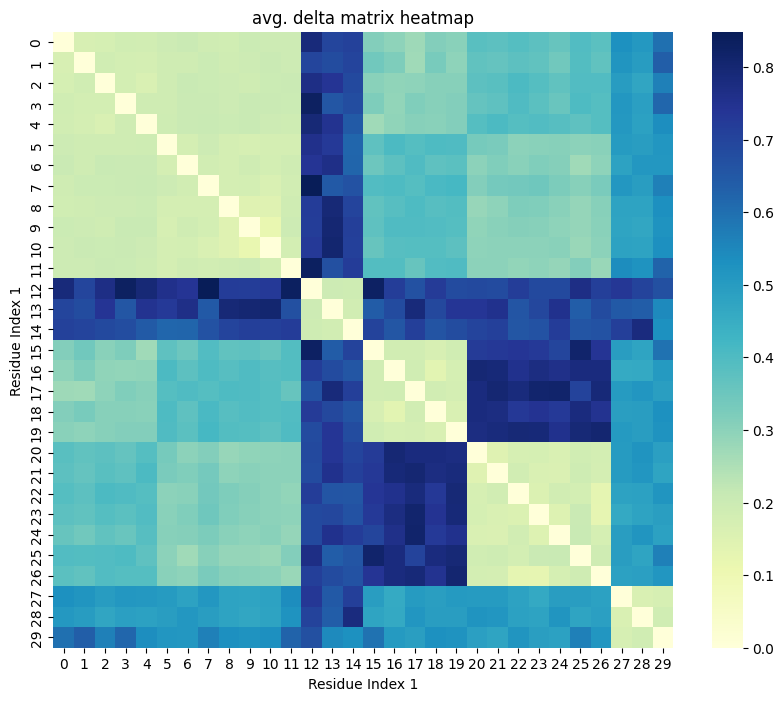

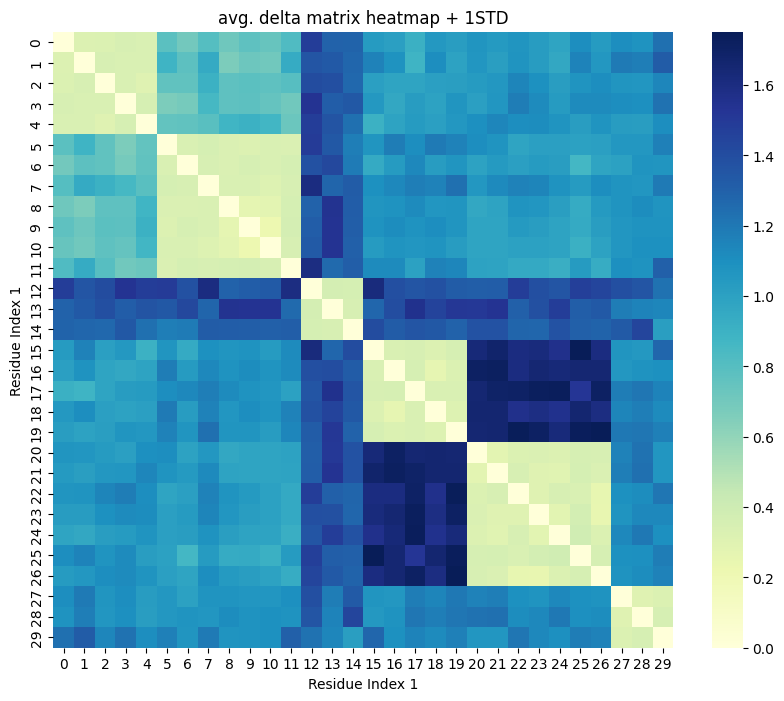

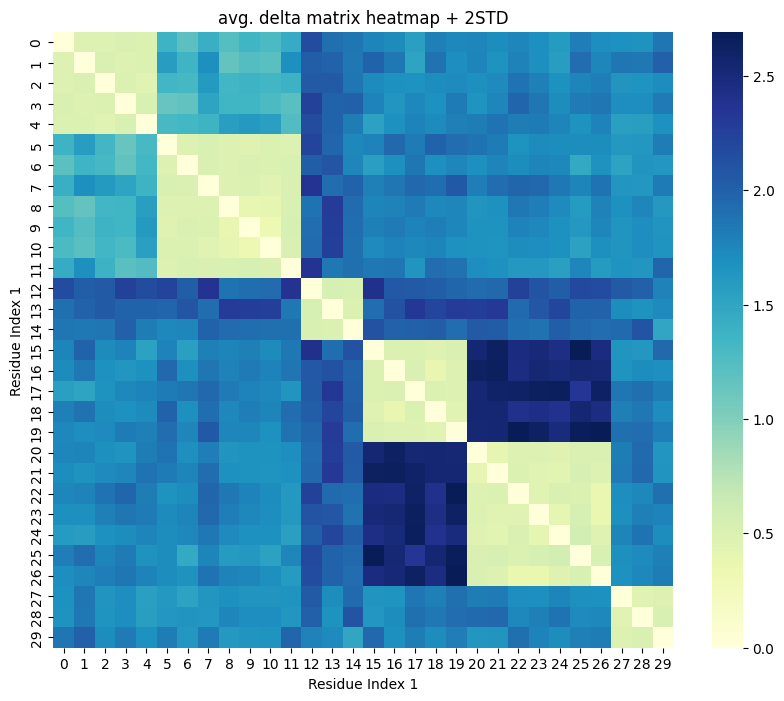

1.3942


In [133]:
%matplotlib inline

res_hdbscan_2std = redpandda_general.main_clustering_general_std(df, None, clustering_algorithm="hdbscan")

In [134]:
res_hdbscan_2std

(array([-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,  0, -1,
        -1, -1,  1, -1,  0, -1, -1, -1,  1, -1, -1, -1, -1]),
 1.0959834358635925,
 array([[1.00000000e+00, 8.23074200e-01, 8.21432789e-01, 8.11010712e-01,
         8.15198383e-01, 4.91640055e-01, 5.56999720e-01, 4.73338484e-01,
         5.39742123e-01, 4.99731820e-01, 5.23017935e-01, 4.61886312e-01,
         1.93154907e-01, 2.94624239e-01, 3.06673066e-01, 3.44319825e-01,
         3.60873700e-01, 4.23564933e-01, 3.35401606e-01, 3.53843450e-01,
         3.47865259e-01, 3.64431150e-01, 3.51201224e-01, 3.73827578e-01,
         4.06945656e-01, 3.28231487e-01, 3.69029123e-01, 3.76429278e-01,
         3.82735737e-01, 3.07386144e-01],
        [8.23074200e-01, 1.00000000e+00, 8.11130326e-01, 8.17090965e-01,
         8.15813445e-01, 4.12510729e-01, 4.95649157e-01, 3.71337197e-01,
         5.73691984e-01, 5.35962539e-01, 5.48319363e-01, 3.71967968e-01,
         2.50977704e-01, 2.58533315e-01, 3.14514333e-01, 2.63766480e-

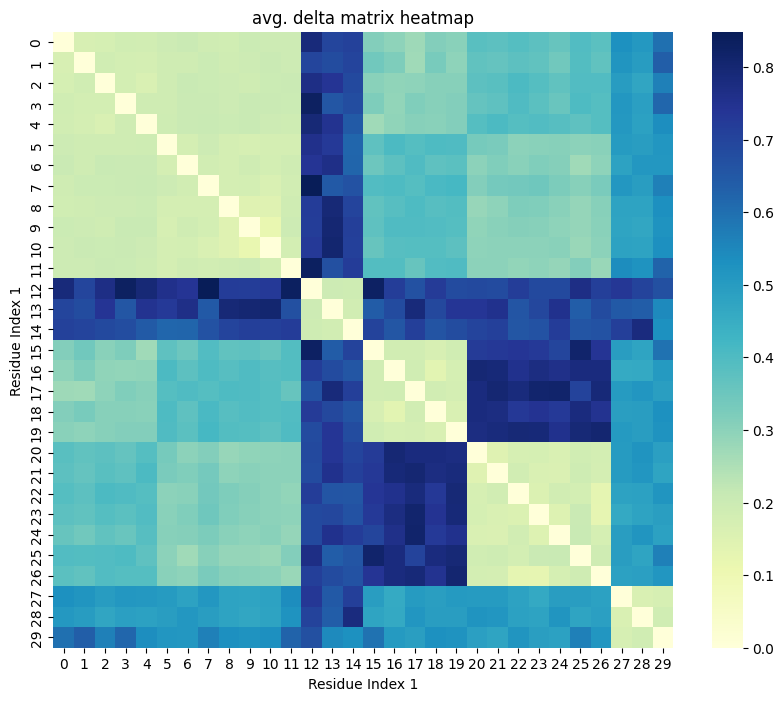

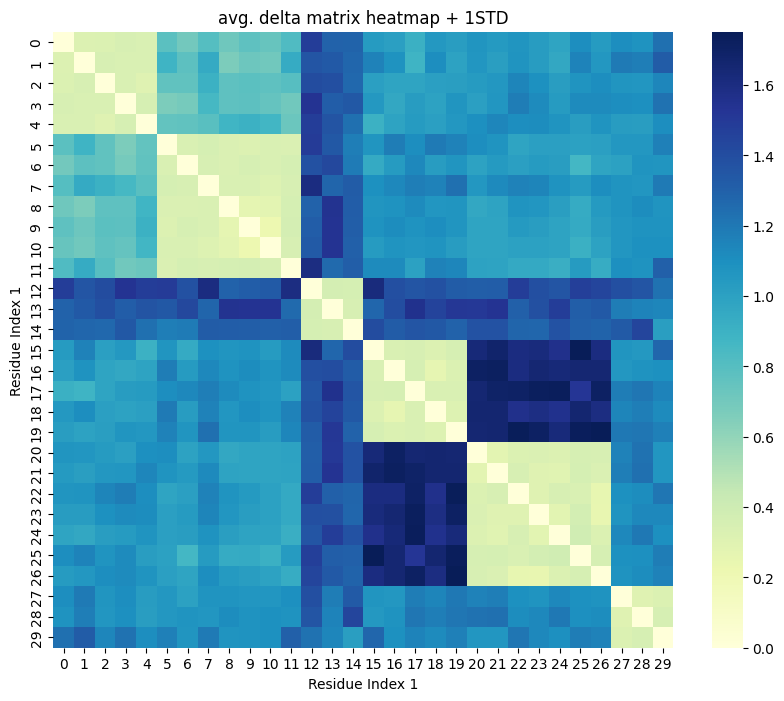

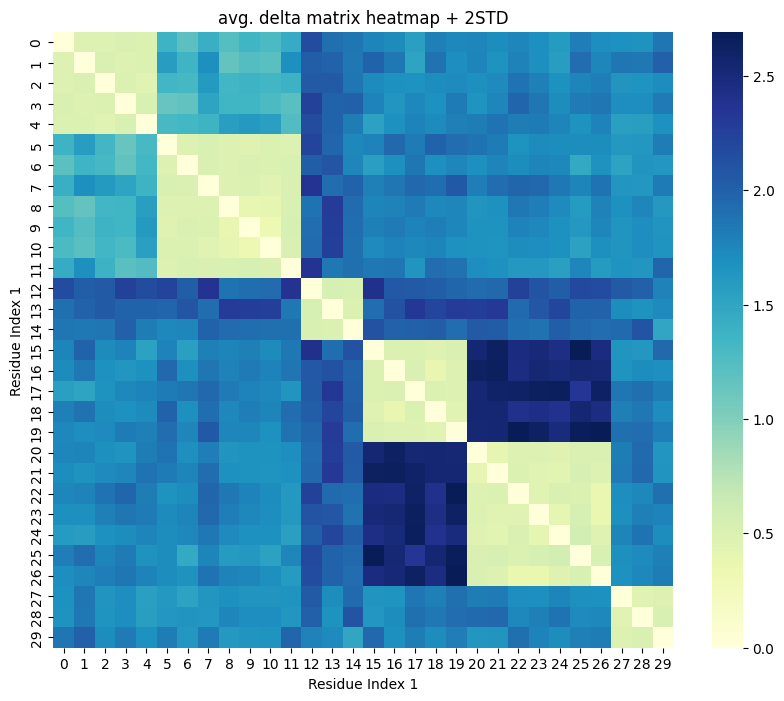

1.3939


In [135]:
res_specvar = redpandda_general.main_clustering_general_std(df, None)

In [136]:
import redpandda_general
res_hdbscan = redpandda_general.main_clustering_general(df, None, clustering_algorithm="hdbscan")

0.0042


In [137]:
res_hdbscan

(array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 2, 2, 2]),
 2.2463634533520094,
 array([[0.98107796, 0.984785  , 0.98495628, 0.98524224, 0.98515614,
         0.98549506, 0.98561535, 0.98536409, 0.98525069, 0.9855214 ,
         0.98550146, 0.98545644, 0.99861272, 0.99665558, 0.99688188,
         0.98806599, 0.98772132, 0.9872013 , 0.9880424 , 0.98781808,
         0.98963921, 0.98948282, 0.98978239, 0.98945109, 0.98912602,
         0.98990594, 0.98954497, 0.99284235, 0.99243497, 0.99444288],
        [0.984785  , 0.98107796, 0.98527049, 0.98512534, 0.98505404,
         0.98534693, 0.98535753, 0.98551373, 0.98529659, 0.98544338,
         0.9856031 , 0.98546326, 0.99664733, 0.9962858 , 0.99669193,
         0.98873348, 0.98823713, 0.9870663 , 0.9884578 , 0.98765968,
         0.98933956, 0.98917565, 0.98948701, 0.98928889, 0.9887055 ,
         0.98987047, 0.98934901, 0.99267258, 0.992207  , 0.99524718],
        [0.98495628, 0.98527049, 0.981077

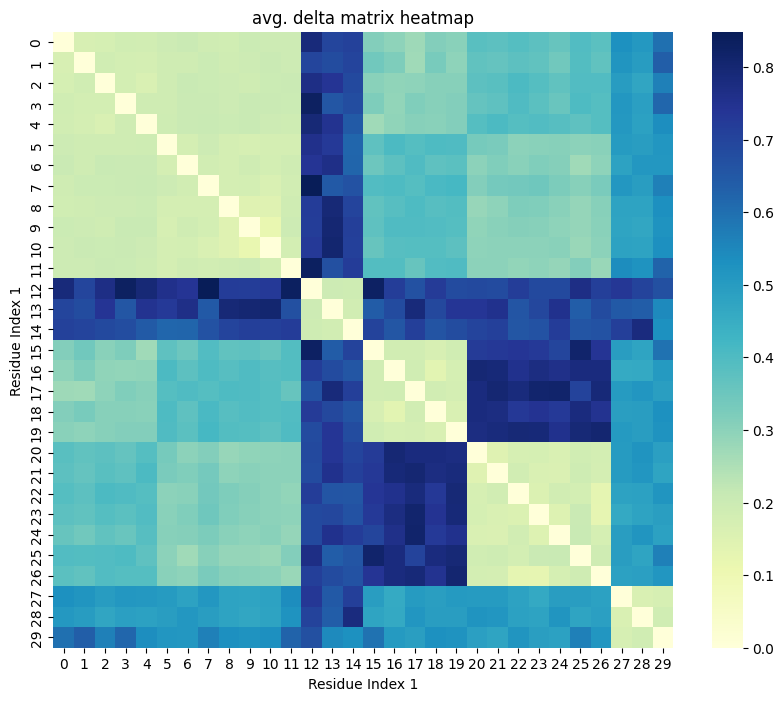

0.4902


In [138]:
res = redpandda_general.main_clustering_general(df, 2)

In [139]:
res_hdbscan = redpandda_general.main_clustering_general(df, None, clustering_algorithm="hdbscan", min_cluster_size=2, min_samples=1)

0.0040


In [140]:
res_hdbscan

(array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 2, 2, 2]),
 2.2463634533520094,
 array([[0.98107796, 0.984785  , 0.98495628, 0.98524224, 0.98515614,
         0.98549506, 0.98561535, 0.98536409, 0.98525069, 0.9855214 ,
         0.98550146, 0.98545644, 0.99861272, 0.99665558, 0.99688188,
         0.98806599, 0.98772132, 0.9872013 , 0.9880424 , 0.98781808,
         0.98963921, 0.98948282, 0.98978239, 0.98945109, 0.98912602,
         0.98990594, 0.98954497, 0.99284235, 0.99243497, 0.99444288],
        [0.984785  , 0.98107796, 0.98527049, 0.98512534, 0.98505404,
         0.98534693, 0.98535753, 0.98551373, 0.98529659, 0.98544338,
         0.9856031 , 0.98546326, 0.99664733, 0.9962858 , 0.99669193,
         0.98873348, 0.98823713, 0.9870663 , 0.9884578 , 0.98765968,
         0.98933956, 0.98917565, 0.98948701, 0.98928889, 0.9887055 ,
         0.98987047, 0.98934901, 0.99267258, 0.992207  , 0.99524718],
        [0.98495628, 0.98527049, 0.981077

In [141]:
res

(array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0]),
 2.216425842886832,
 [],
 [array([[ 0],
         [ 1],
         [ 2],
         [ 3],
         [ 4],
         [ 5],
         [ 6],
         [ 7],
         [ 8],
         [ 9],
         [10],
         [11],
         [12],
         [13],
         [14],
         [15],
         [16],
         [17],
         [18],
         [19],
         [20],
         [21],
         [22],
         [23],
         [24],
         [25],
         [26],
         [27],
         [28],
         [29]]),
  array([[ 0],
         [ 1],
         [ 2],
         [ 3],
         [ 4],
         [ 5],
         [ 6],
         [ 7],
         [ 8],
         [ 9],
         [10],
         [11],
         [12],
         [13],
         [14],
         [15],
         [16],
         [17],
         [18],
         [19],
         [20],
         [21],
         [22],
         [23],
         [24],
         [25],
         [26],
         [

In [142]:
res_agglon = redpandda_general.main_clustering_general(df, None, clustering_algorithm="agglomerative")

something wrong with clustering Q computation


In [143]:
res_agglon

(array([20, 21, 22, 27, 29, 18, 19, 17, 26, 14, 24, 25,  8, 16, 23, 15, 28,
         7, 10,  9, 12,  3, 11, 13,  4,  6,  1,  5,  2,  0]),
 [],
 array([[0.        , 0.19591149, 0.20496303, 0.22007561, 0.21552532,
         0.23343709, 0.23979412, 0.22651534, 0.22052237, 0.23482882,
         0.23377508, 0.23139608, 0.9266847 , 0.82325291, 0.8352124 ,
         0.36930639, 0.35109101, 0.32360916, 0.36805991, 0.35620475,
         0.45244859, 0.44418377, 0.46001551, 0.44250693, 0.42532738,
         0.46654505, 0.44746829, 0.62172966, 0.60020024, 0.70631504],
        [0.19591149, 0.        , 0.22156849, 0.21389794, 0.21012984,
         0.22560825, 0.22616856, 0.23442342, 0.22294785, 0.23070562,
         0.23914643, 0.23175619, 0.82281654, 0.80371063, 0.82517356,
         0.40458201, 0.37835108, 0.31647464, 0.39001318, 0.34783337,
         0.43661244, 0.42795036, 0.44440483, 0.43393476, 0.4031033 ,
         0.46467059, 0.43711203, 0.6127573 , 0.58815227, 0.74882098],
        [0.20496303, 0.2215

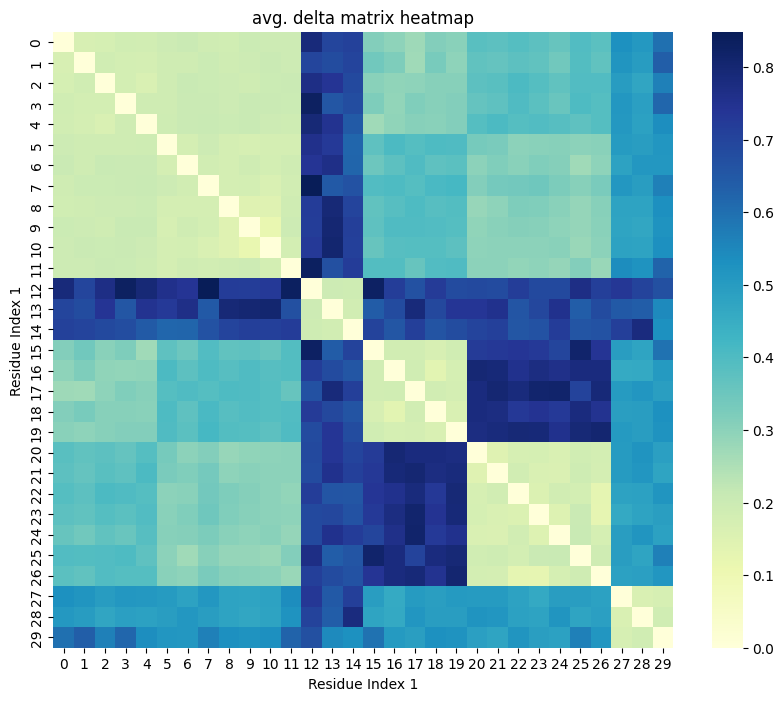

0.5162


In [144]:
res = redpandda_general.main_clustering_general(df, 6)

In [145]:
res_hdbscan = redpandda_general.main_clustering_general(df, None, clustering_algorithm="hdbscan")

0.0025


In [146]:
res_hdbscan

(array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 2, 2, 2]),
 2.2463634533520094,
 array([[0.98107796, 0.984785  , 0.98495628, 0.98524224, 0.98515614,
         0.98549506, 0.98561535, 0.98536409, 0.98525069, 0.9855214 ,
         0.98550146, 0.98545644, 0.99861272, 0.99665558, 0.99688188,
         0.98806599, 0.98772132, 0.9872013 , 0.9880424 , 0.98781808,
         0.98963921, 0.98948282, 0.98978239, 0.98945109, 0.98912602,
         0.98990594, 0.98954497, 0.99284235, 0.99243497, 0.99444288],
        [0.984785  , 0.98107796, 0.98527049, 0.98512534, 0.98505404,
         0.98534693, 0.98535753, 0.98551373, 0.98529659, 0.98544338,
         0.9856031 , 0.98546326, 0.99664733, 0.9962858 , 0.99669193,
         0.98873348, 0.98823713, 0.9870663 , 0.9884578 , 0.98765968,
         0.98933956, 0.98917565, 0.98948701, 0.98928889, 0.9887055 ,
         0.98987047, 0.98934901, 0.99267258, 0.992207  , 0.99524718],
        [0.98495628, 0.98527049, 0.981077

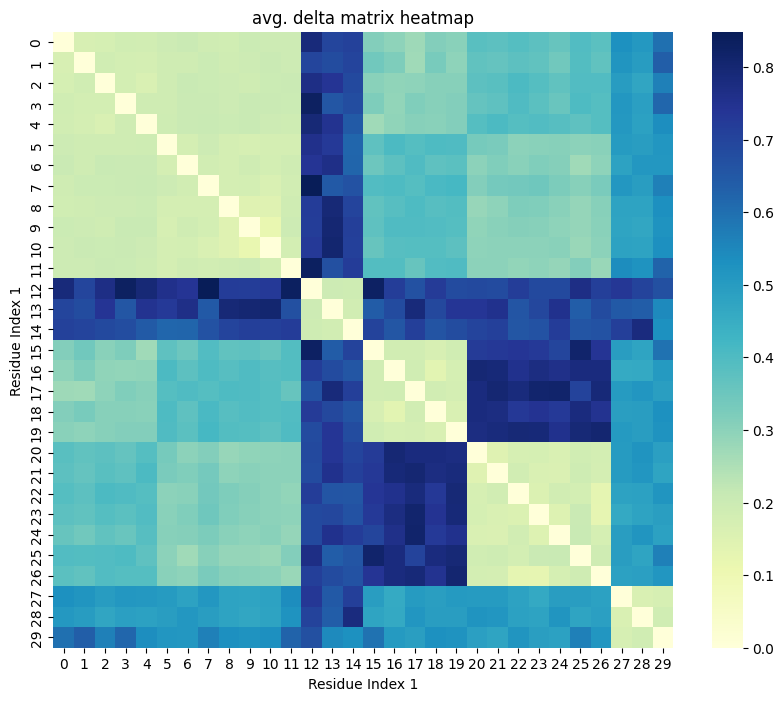

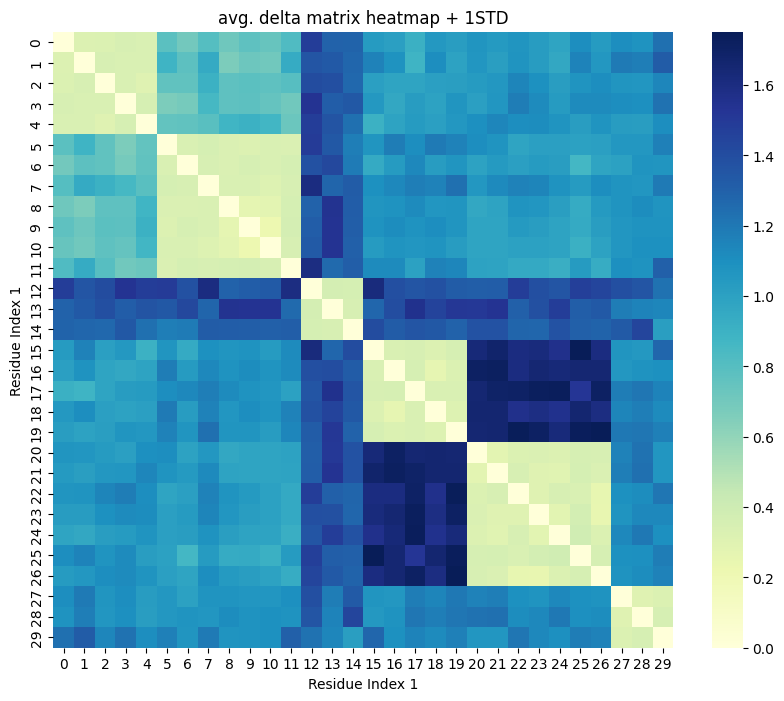

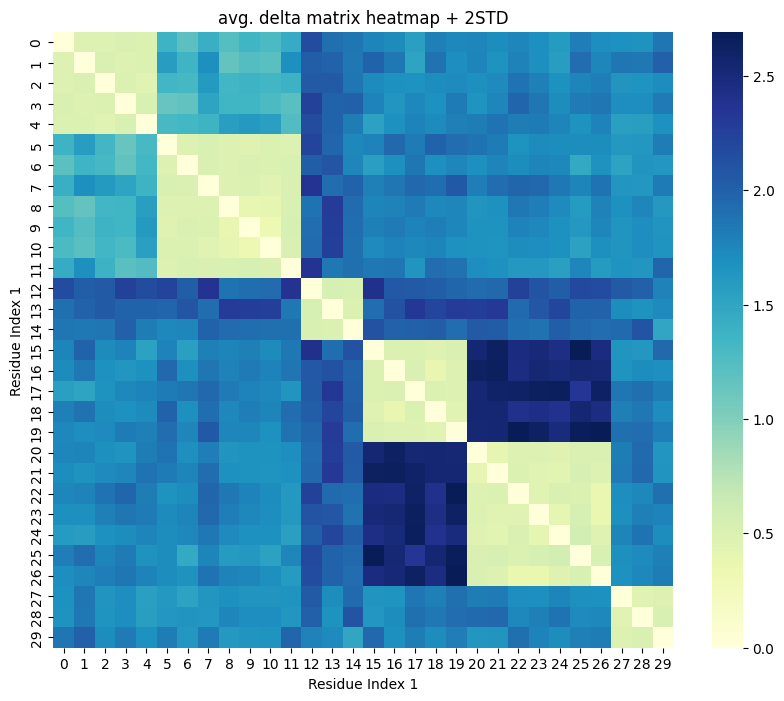

1.7809


In [147]:
res_specvar = redpandda_general.main_clustering_general_std(df, None)

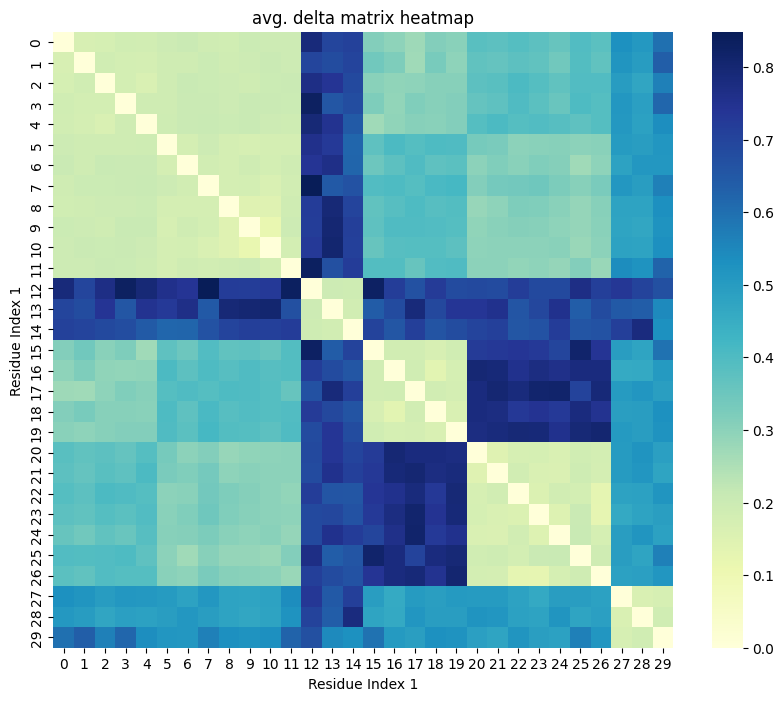

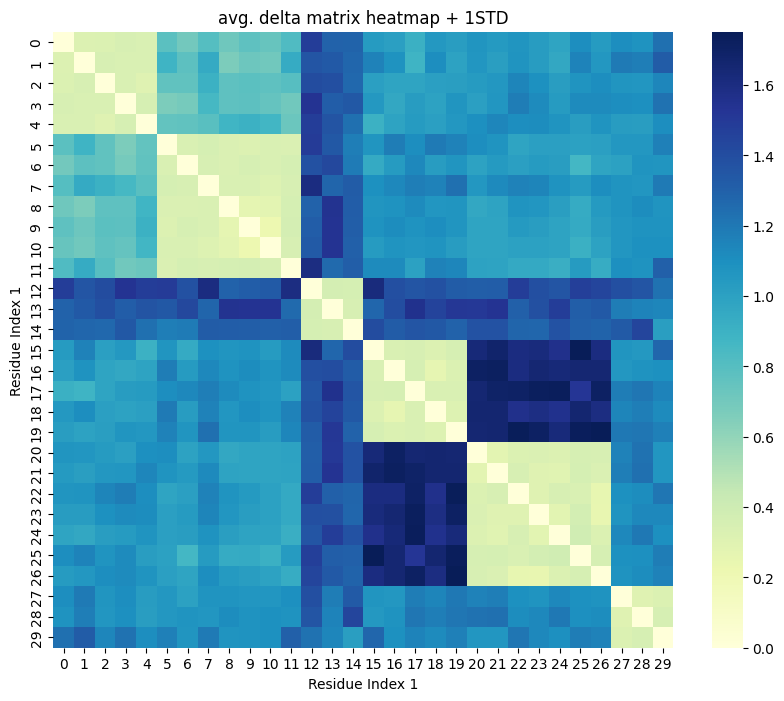

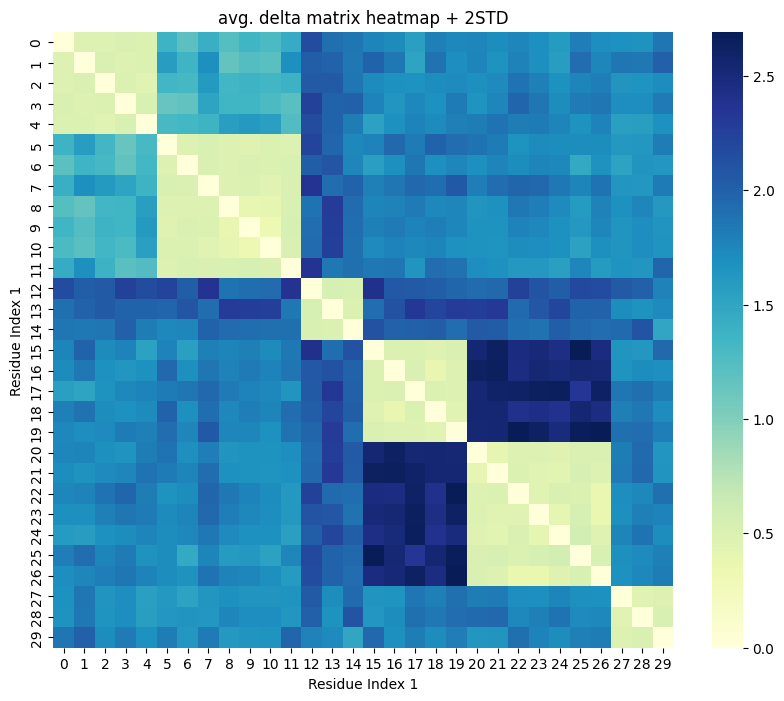

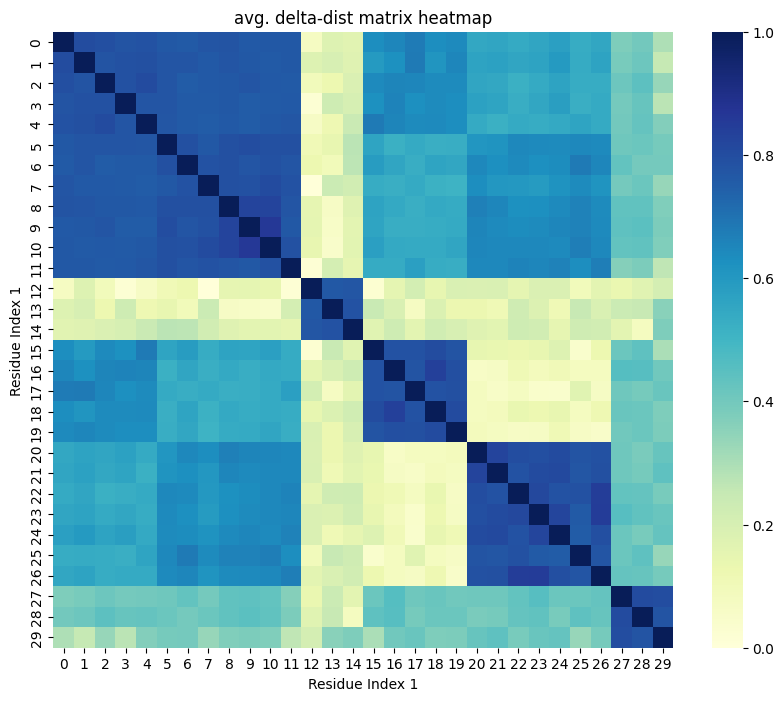

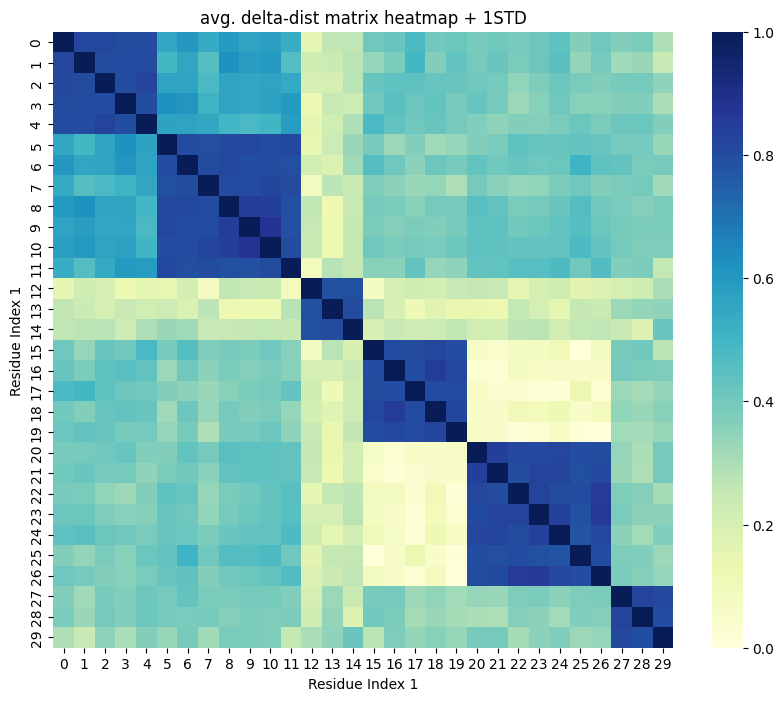

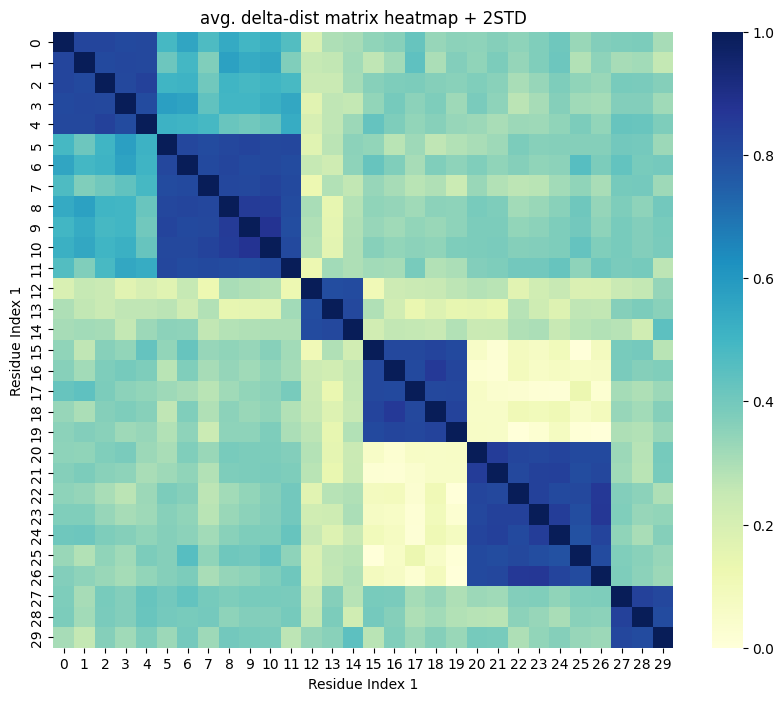

2.8093


In [148]:
res_specvar_distance = redpandda_general.main_clustering_general_std_distance(df, None)

In [149]:
result_labels = res[0]

In [150]:
result_labels

array([0, 0, 0, 2, 2, 2, 2, 2, 3, 3, 3, 2, 5, 5, 5, 2, 2, 2, 2, 0, 4, 4,
       4, 4, 4, 4, 4, 1, 1, 1])

In [151]:
trajectories_results = []
for ip, particle_traj in enumerate(trajectories):
    trajectory_result = []

    for it, timestep in enumerate(particle_traj):
        trajectory_result.append([*timestep[:-1], result_labels[ip]])
    trajectories_results.append(trajectory_result)

In [152]:
trajectories_results = [
    [[*timestep[:-1], result_labels[ip]] for timestep in particle_traj]
    for ip, particle_traj in enumerate(trajectories)
]

In [153]:
traj_array, point_array, frames_count, n_objects = redpandda_general.prepare_data_from_df(df)

In [154]:
dist_matrices = redpandda_general.get_distance_matrices(traj_array)
delta_matrices = redpandda_general.get_delta_matrices(dist_matrices)
average_delta_matrix = redpandda_general.calculate_average_delta_matrix(delta_matrices)

std_delta_matrix = redpandda_general.get_std_matrices(dist_matrices)

In [155]:
std_delta_matrix

array([[0.        , 0.15512213, 0.15349178, 0.16111378, 0.15740537,
        0.58551209, 0.49480072, 0.61309416, 0.52621725, 0.5740251 ,
        0.5431149 , 0.6264448 , 0.69330069, 0.60054859, 0.57924894,
        0.72624379, 0.71168121, 0.63892148, 0.73878205, 0.71897838,
        0.68619108, 0.66739016, 0.67848809, 0.65544835, 0.61814072,
        0.7066488 , 0.65980482, 0.57589819, 0.57654108, 0.63298164],
       [0.15512213, 0.        , 0.16031925, 0.15554732, 0.1588665 ,
        0.69539032, 0.58319753, 0.74709462, 0.47947085, 0.52698598,
        0.5067646 , 0.74737696, 0.65950862, 0.65744106, 0.57294943,
        0.8197498 , 0.76235449, 0.6184318 , 0.77708608, 0.70105   ,
        0.69393891, 0.65074148, 0.70110833, 0.65880029, 0.61823667,
        0.76226883, 0.68851792, 0.67124304, 0.67456397, 0.68550403],
       [0.15349178, 0.16031925, 0.        , 0.15761008, 0.14042143,
        0.57215729, 0.55680066, 0.70285474, 0.57322481, 0.59291378,
        0.56845196, 0.58893288, 0.63784172, 0.

In [156]:
summed_delta_matrix = average_delta_matrix

In [157]:
summed_delta_matrix_1std = summed_delta_matrix + std_delta_matrix 
summed_delta_matrix_2std = summed_delta_matrix + std_delta_matrix * 2

In [158]:
from distance_matrix import *

In [159]:
normed_delta_matrix = 1 - normed_values(summed_delta_matrix)
normed_delta_matrix_1std = 1 - normed_values(summed_delta_matrix_1std)
normed_delta_matrix_2std = 1 - normed_values(summed_delta_matrix_2std)

In [160]:
normed_similarity_matrix = 1 - normed_values(summed_delta_matrix)
normed_similarity_matrix_1std = 1 - normed_values(summed_delta_matrix_1std)
normed_similarity_matrix_2std = 1 - normed_values(summed_delta_matrix_2std)

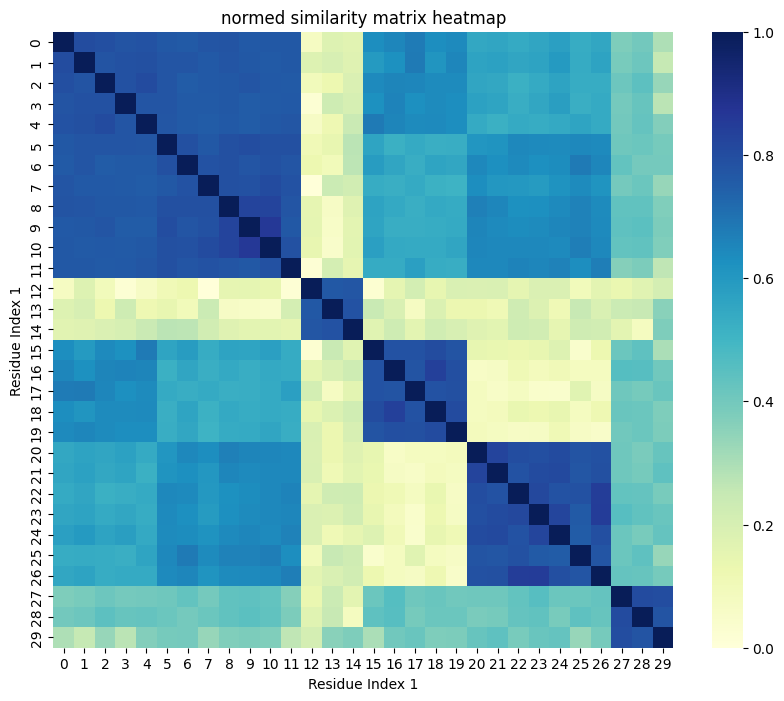

In [161]:
create_delta_heatmap(normed_similarity_matrix, title="normed similarity matrix heatmap")

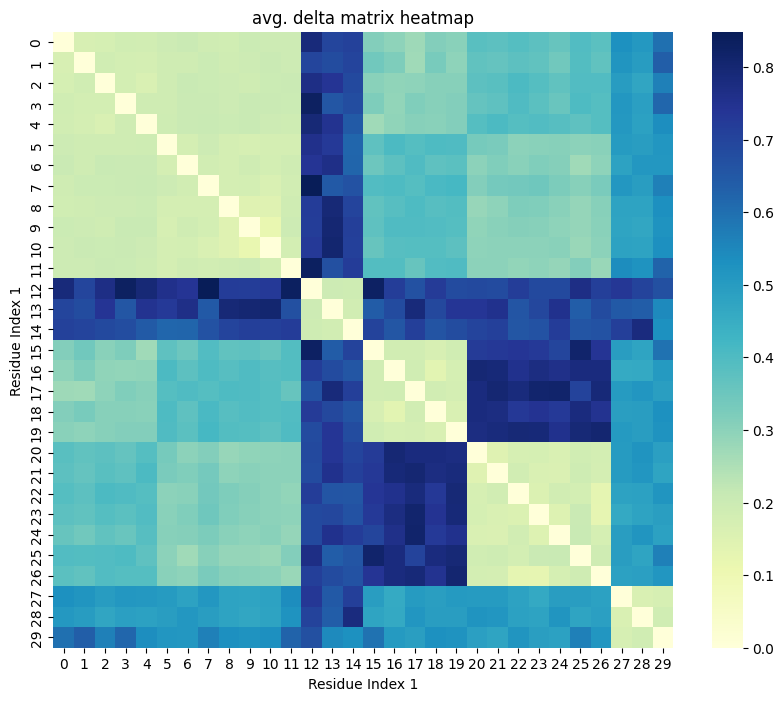

In [162]:
import distance_matrix
distance_matrix.create_delta_heatmap(average_delta_matrix, title="avg. delta matrix heatmap")

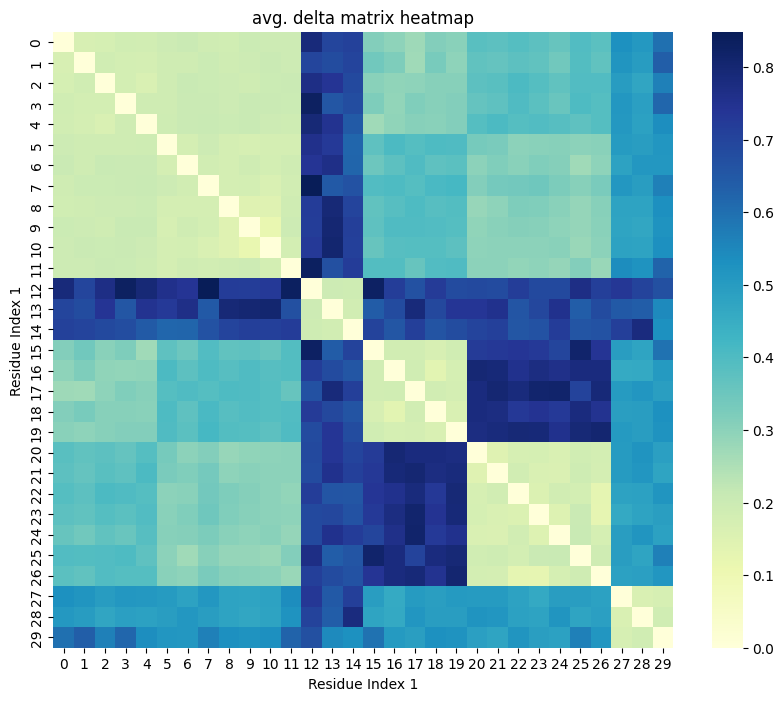

0.4409


array([5, 5, 5, 5, 1, 1, 1, 1, 0, 0, 0, 1, 4, 4, 4, 5, 5, 5, 5, 5, 3, 3,
       3, 3, 3, 1, 3, 2, 2, 2])

In [163]:
spectral_clustering_on_deltas(average_delta_matrix, 6)

In [164]:
clustering = SpectralClustering(n_clusters=6, affinity='precomputed')
result = clustering.fit(normed_similarity_matrix)

In [165]:
result.labels_

array([2, 2, 2, 2, 4, 4, 4, 4, 5, 5, 5, 2, 3, 3, 3, 1, 1, 1, 1, 1, 2, 2,
       2, 2, 2, 4, 2, 0, 0, 0], dtype=int32)

In [166]:
clustering = SpectralClustering(n_clusters=6, affinity='precomputed')
result = clustering.fit(summed_delta_matrix_2std)
print(result.labels_)

[0 5 2 2 4 5 3 1 4 4 4 0 0 4 3 0 3 3 5 2 5 3 2 2 3 0 2 2 3 0]


In [167]:
import hdbscan

clustering = hdbscan.HDBSCAN(min_cluster_size=4, min_samples=2, metric='precomputed') 

result = clustering.fit(summed_delta_matrix.astype(np.float64))

print(result.labels_)

[ 1  1  1  1  1  1  1  1  1  1  1  1 -1 -1 -1  2  2  2  2  2  0  0  0  0
  0  0  0 -1 -1 -1]


In [168]:
import hdbscan

clustering = hdbscan.HDBSCAN(min_cluster_size=4, min_samples=2, metric='precomputed') 


result = clustering.fit(summed_delta_matrix_1std.astype(np.float64))

print(result.labels_)

[ 2  2  2  2  2  3  3  3  3  3  3  3 -1 -1 -1  0  0  0  0  0  1  1  1  1
  1  1  1 -1 -1 -1]


In [169]:
import hdbscan

clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2, metric='precomputed') 


result = clustering.fit(summed_delta_matrix_2std.astype(np.float64))

print(result.labels_)

[4 4 4 4 4 5 5 5 5 5 5 5 2 2 2 0 0 0 0 0 3 3 3 3 3 3 3 1 1 1]


In [170]:
normed_delta_matrix = normed_values(summed_delta_matrix)
normed_delta_matrix_1std = normed_values(summed_delta_matrix_1std)
normed_delta_matrix_2std =  normed_values(summed_delta_matrix_2std)

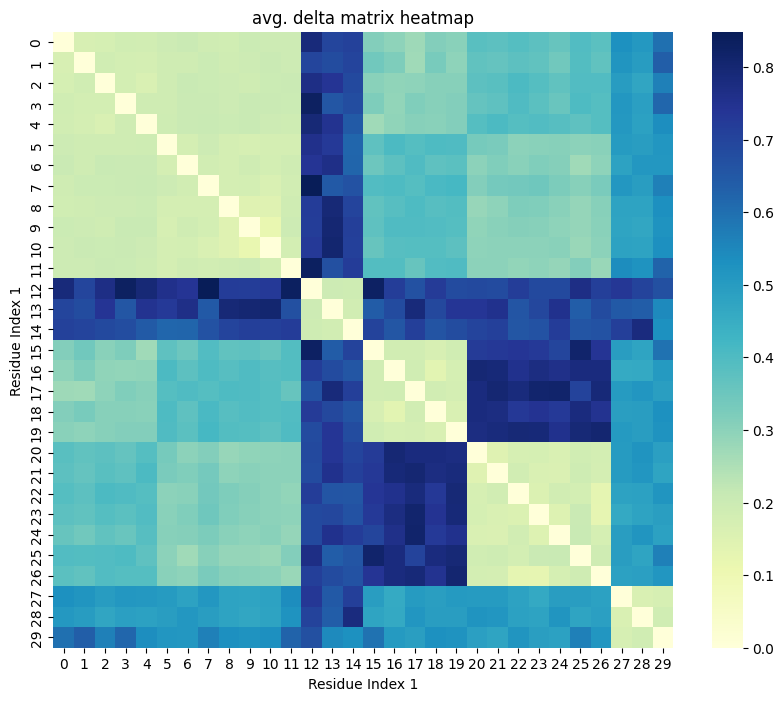

0.5104


array([0, 0, 3, 0, 4, 4, 4, 4, 5, 5, 5, 0, 2, 2, 2, 3, 3, 3, 3, 3, 0, 0,
       0, 0, 0, 4, 0, 1, 1, 1])

In [171]:
spectral_clustering_on_deltas(average_delta_matrix, 6)

In [172]:
clustering = AgglomerativeClustering(n_clusters=None, distance_threshold=0.1, affinity='precomputed', linkage='complete')

result = clustering.fit(average_delta_matrix)

In [173]:

clustering = AgglomerativeClustering(n_clusters=None, distance_threshold=0.7, metric='precomputed', linkage='complete')

result = clustering.fit(summed_delta_matrix_2std)

In [174]:
result.labels_

array([5, 5, 5, 5, 5, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 3, 3, 3, 3, 3, 0, 0,
       0, 0, 0, 0, 0, 4, 4, 4])

In [175]:
import hdbscan

clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2, metric='precomputed') 


result = clustering.fit(summed_delta_matrix_2std.astype(np.float64))

print(result.labels_)

[4 4 4 4 4 5 5 5 5 5 5 5 2 2 2 0 0 0 0 0 3 3 3 3 3 3 3 1 1 1]


In [176]:
import hdbscan

clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2, metric='precomputed') 


result = clustering.fit(summed_delta_matrix.astype(np.float64))

print(result.labels_)

[3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 4 4 4 4 4 2 2 2 2 2 2 2 1 1 1]


In [177]:
import hdbscan

clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2, metric='precomputed') 


result = clustering.fit(normed_delta_matrix_2std.astype(np.float64))

print(result.labels_)

[4 4 4 4 4 5 5 5 5 5 5 5 2 2 2 0 0 0 0 0 3 3 3 3 3 3 3 1 1 1]


In [178]:
#FF

In [179]:
clustering = SpectralClustering(n_clusters=6, affinity='precomputed')
result_spectral_6 = clustering.fit(normed_similarity_matrix)

clustering = SpectralClustering(n_clusters=3, affinity='precomputed')
result_spectral_3 = clustering.fit(normed_similarity_matrix)

In [180]:
clustering = SpectralClustering(n_clusters=4, affinity='precomputed')
result_spectral_4 = clustering.fit(normed_similarity_matrix)

In [181]:
clustering = SpectralClustering(n_clusters=6, affinity='precomputed', assign_labels="discretize")
result_spectral_6_discr = clustering.fit(normed_similarity_matrix)

In [182]:
clustering = SpectralClustering(n_clusters=6, affinity='precomputed', assign_labels="discretize")
result_spectral_6_discr = clustering.fit(normed_similarity_matrix)
result_spectral_6_discr.labels_

array([2, 2, 2, 4, 4, 4, 0, 4, 0, 0, 0, 4, 5, 5, 5, 4, 4, 4, 4, 2, 1, 1,
       1, 1, 1, 1, 1, 3, 3, 3])

In [183]:
clustering = SpectralClustering(n_clusters=3, affinity='precomputed', assign_labels="discretize")
result_spectral_3_discr = clustering.fit(normed_similarity_matrix)
result_spectral_3_discr.labels_

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 0, 0,
       0, 0, 0, 0, 0, 2, 2, 1])

In [184]:
clustering = SpectralClustering(n_clusters=6, affinity='precomputed', assign_labels="cluster_qr")
result_spectral_6_discr = clustering.fit(normed_similarity_matrix)
result_spectral_6_discr.labels_

array([3, 3, 3, 3, 4, 4, 4, 4, 2, 2, 2, 0, 0, 2, 0, 5, 5, 5, 5, 5, 3, 3,
       4, 3, 3, 4, 4, 1, 1, 1])

In [185]:
clustering = SpectralClustering(n_clusters=6, affinity='precomputed')
result_spectral_6_discr = clustering.fit(normed_similarity_matrix)
result_spectral_6_discr.labels_

array([3, 3, 3, 3, 1, 1, 1, 1, 5, 5, 5, 3, 2, 2, 2, 0, 0, 0, 0, 0, 3, 3,
       3, 3, 3, 1, 3, 4, 4, 4], dtype=int32)

In [186]:
result_spectral_3.labels_

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

In [187]:
result_spectral_6.labels_

array([0, 0, 0, 0, 4, 4, 4, 4, 4, 4, 4, 0, 2, 2, 2, 5, 5, 5, 5, 5, 1, 1,
       1, 1, 1, 4, 1, 3, 3, 3], dtype=int32)

In [188]:
result_spectral_6_discr.labels_

array([3, 3, 3, 3, 1, 1, 1, 1, 5, 5, 5, 3, 2, 2, 2, 0, 0, 0, 0, 0, 3, 3,
       3, 3, 3, 1, 3, 4, 4, 4], dtype=int32)

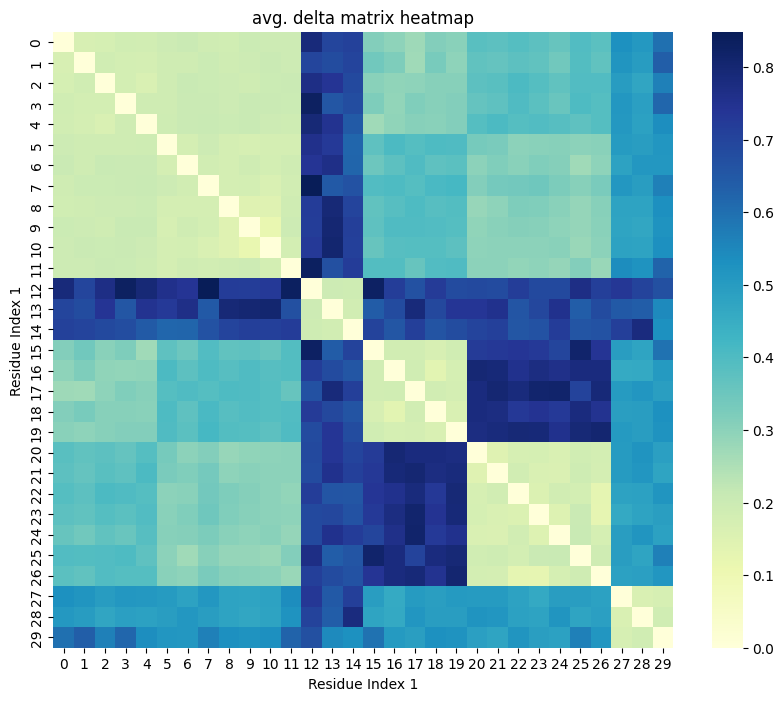

0.5847


array([3, 3, 3, 3, 1, 1, 1, 1, 0, 0, 0, 3, 4, 4, 4, 3, 3, 0, 3, 0, 5, 5,
       5, 5, 5, 1, 5, 2, 2, 2])

In [189]:
distance_matrix.spectral_clustering_on_deltas(summed_delta_matrix, 6)

In [190]:
normed_similarity_matrix = 1 - normed_values(summed_delta_matrix)


In [191]:
clustering = SpectralClustering(n_clusters=6, affinity='precomputed')
result = clustering.fit(summed_delta_matrix_2std)
print(result.labels_)

[1 5 2 4 0 5 2 2 0 0 0 1 4 0 3 1 5 4 5 2 5 5 4 4 4 1 4 3 3 4]


In [192]:
import hdbscan

clustering = hdbscan.HDBSCAN(min_cluster_size=4, min_samples=2, metric='precomputed') 

result_hdbscan_4_2 = clustering.fit(summed_delta_matrix.astype(np.float64))

print(result_hdbscan_4_2.labels_)

[ 1  1  1  1  1  1  1  1  1  1  1  1 -1 -1 -1  2  2  2  2  2  0  0  0  0
  0  0  0 -1 -1 -1]


In [193]:
import hdbscan

clustering = hdbscan.HDBSCAN(min_cluster_size=4, min_samples=2, metric='precomputed') 


result_hdbscan_4_2_1std = clustering.fit(summed_delta_matrix_1std.astype(np.float64))

print(result_hdbscan_4_2_1std.labels_)

[ 2  2  2  2  2  3  3  3  3  3  3  3 -1 -1 -1  0  0  0  0  0  1  1  1  1
  1  1  1 -1 -1 -1]


In [194]:
import hdbscan

clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2, metric='precomputed') 


result_hdbscan_2_2_2std = clustering.fit(summed_delta_matrix_2std.astype(np.float64))

print(result_hdbscan_2_2_2std.labels_)

[4 4 4 4 4 5 5 5 5 5 5 5 2 2 2 0 0 0 0 0 3 3 3 3 3 3 3 1 1 1]


In [195]:
normed_delta_matrix = normed_values(summed_delta_matrix)
normed_delta_matrix_1std = normed_values(summed_delta_matrix_1std)
normed_delta_matrix_2std =  normed_values(summed_delta_matrix_2std)

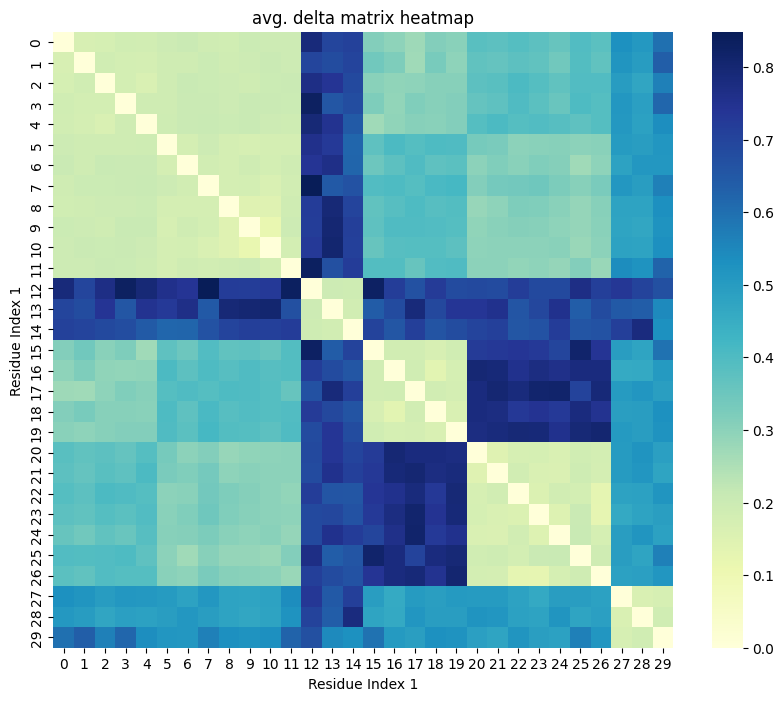

0.4504


array([5, 5, 5, 5, 0, 0, 0, 0, 2, 2, 2, 0, 4, 4, 4, 5, 5, 5, 5, 5, 3, 3,
       3, 3, 3, 0, 3, 1, 1, 1])

In [196]:
spectral_clustering_on_deltas(average_delta_matrix, 6)

In [197]:
clustering = AgglomerativeClustering(n_clusters=None, distance_threshold=0.1, affinity='precomputed', linkage='complete')

result_agglo_compl_dt01 = clustering.fit(average_delta_matrix)

In [198]:

clustering = AgglomerativeClustering(n_clusters=None, distance_threshold=0.7, metric='precomputed', linkage='complete')

result_agglo_compl_dt07_2std  = clustering.fit(summed_delta_matrix_2std)

In [199]:

clustering = AgglomerativeClustering(n_clusters=3, metric='precomputed', linkage='complete')

result_agglo_cl3  = clustering.fit(average_delta_matrix)

In [200]:
result_agglo_compl_dt01.labels_

array([20, 21, 22, 27, 29, 18, 19, 17, 26, 14, 24, 25,  8, 16, 23, 15, 28,
        7, 10,  9, 12,  3, 11, 13,  4,  6,  1,  5,  2,  0])

In [201]:
result_agglo_cl3.labels_

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 0, 0, 0, 0, 0, 2, 2,
       2, 2, 2, 2, 2, 0, 0, 0])

In [202]:
import hdbscan

clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2, metric='precomputed') 


result_hdbscan_2_2 = clustering.fit(summed_delta_matrix.astype(np.float64))

print(result_hdbscan_2_2.labels_)

[3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 4 4 4 4 4 2 2 2 2 2 2 2 1 1 1]


In [203]:
result_hdbscan_2_2_2std.labels_

array([4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 2, 2, 2, 0, 0, 0, 0, 0, 3, 3,
       3, 3, 3, 3, 3, 1, 1, 1])

In [204]:
groups_list = np.array(trajectories)[:,:,-1]
num_groups = len(np.unique(np.array(groups_list).flatten()))

In [205]:
true_labels = groups_list[:,0]

In [206]:
true_labels

array([1., 1., 1., 1., 1., 2., 2., 2., 2., 2., 2., 2., 3., 3., 3., 4., 4.,
       4., 4., 4., 5., 5., 5., 5., 5., 5., 5., 6., 6., 6.])

In [207]:
residue_items = list(range(len(true_labels)))

In [208]:
import visualizations


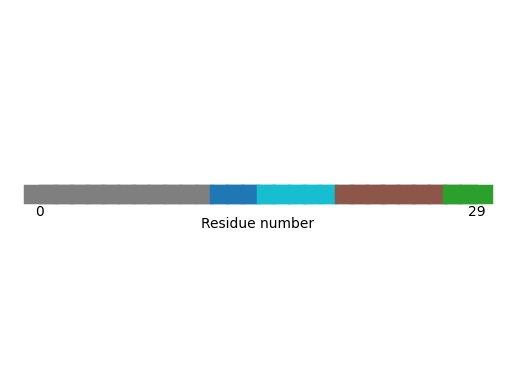

In [209]:
visualizations.plot_residue_line_plus_noise(residue_items, result_hdbscan_2_2.labels_)

In [210]:
from sklearn.cluster import AffinityPropagation

In [211]:
clustering_aff = AffinityPropagation(random_state=5, affinity="precomputed").fit(normed_similarity_matrix.astype(np.float64))
clustering_aff_1std = AffinityPropagation(random_state=5, affinity="precomputed").fit(normed_similarity_matrix_1std.astype(np.float64))
clustering_aff_2std = AffinityPropagation(random_state=5, affinity="precomputed").fit(normed_similarity_matrix_2std.astype(np.float64))

In [212]:
clustering.labels_

array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 0, 0, 0, 4, 4, 4, 4, 4, 2, 2,
       2, 2, 2, 2, 2, 1, 1, 1])

In [213]:
clustering_aff_1std.labels_

array([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 3, 3, 3, 3, 3, 4, 4,
       4, 4, 4, 4, 4, 5, 5, 5])

In [214]:
clustering_aff_2std.labels_

array([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 3, 3, 3, 3, 3, 4, 4,
       4, 4, 4, 4, 4, 5, 5, 5])

In [215]:
res_hdbscan_2_1 = redpandda_general.main_clustering_general(df, None, clustering_algorithm="hdbscan", min_cluster_size=2, min_samples=1)

0.0021


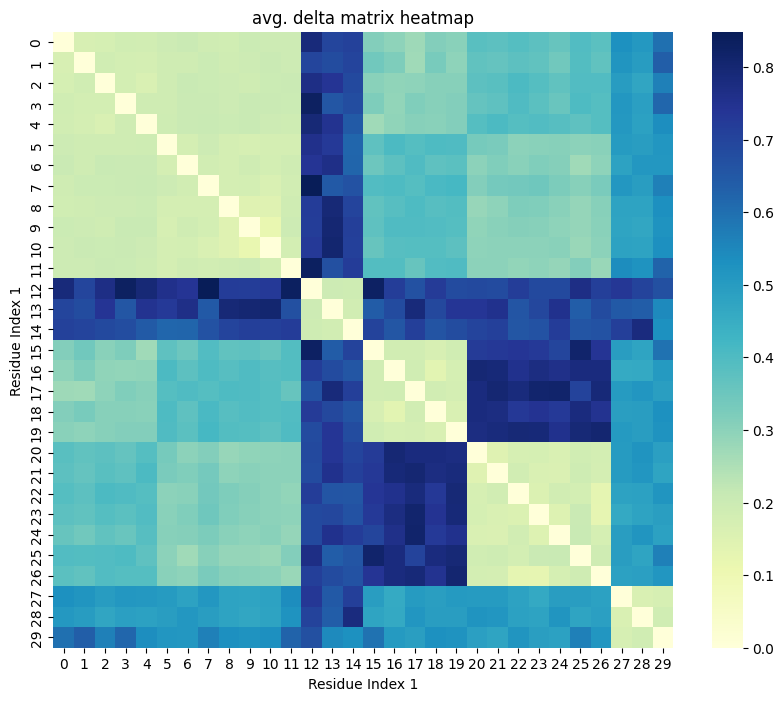

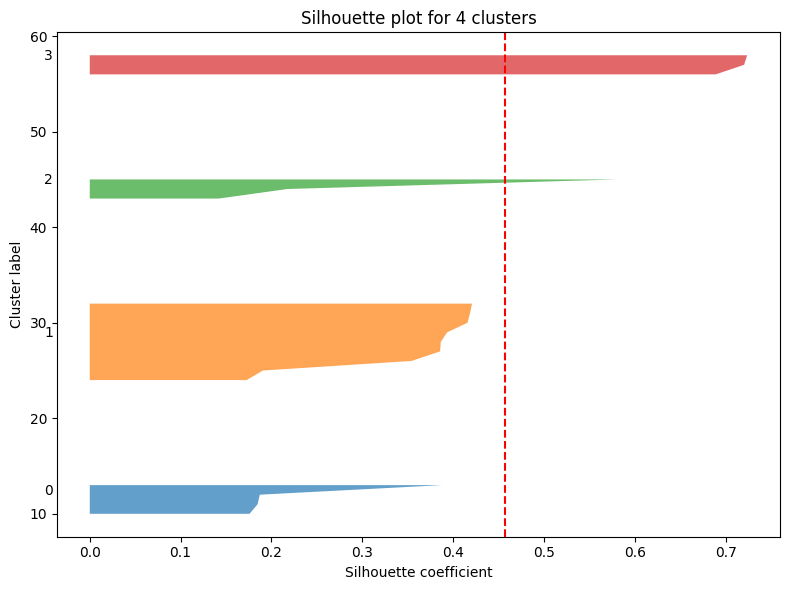

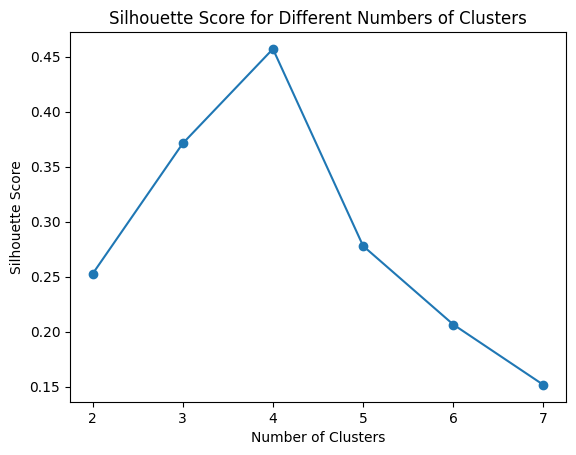

1.0062


In [216]:
spectral_opt_sil = distance_matrix.spectral_clustering_on_deltas(summed_delta_matrix, cluster_count=None, silhouette = True)
spectral_opt_sil = list(spectral_opt_sil)


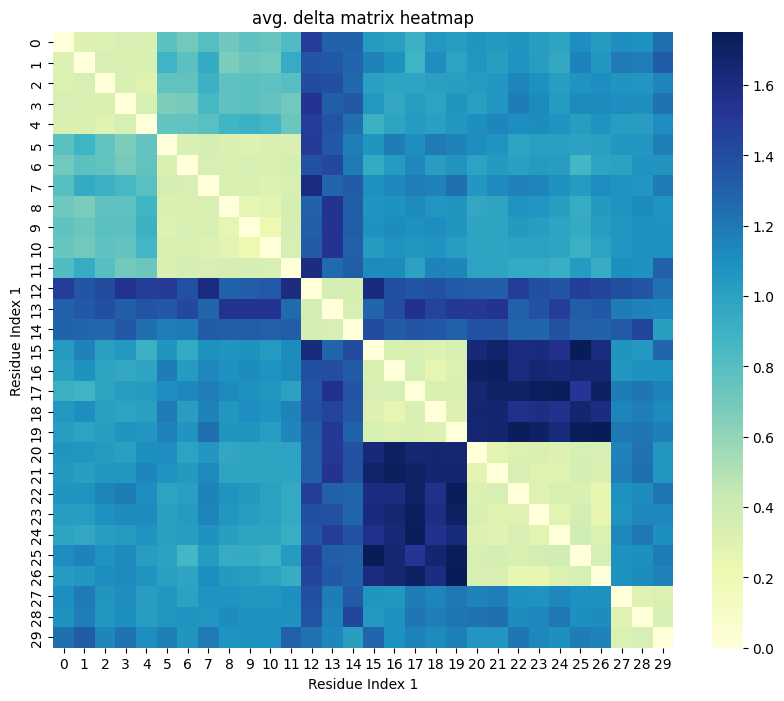

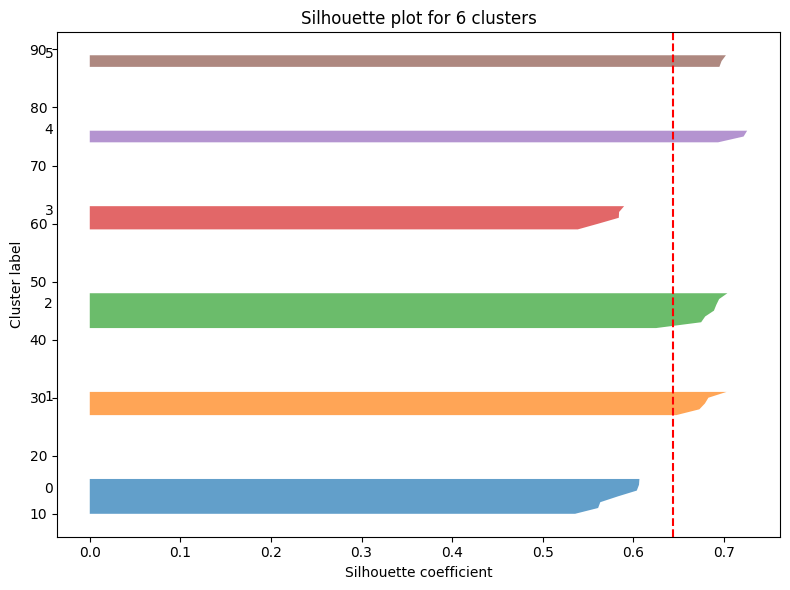

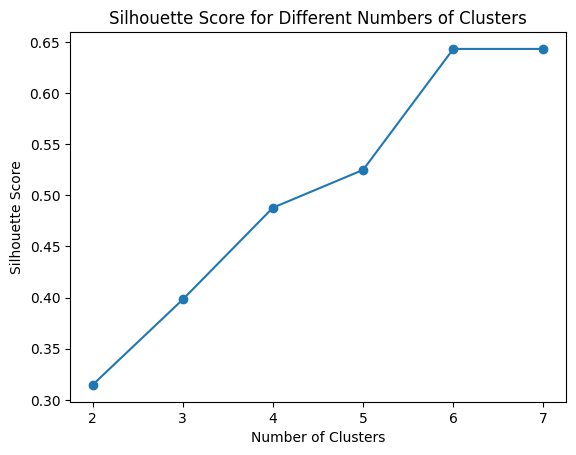

0.8935


In [217]:
spectral_opt_sil_1std = distance_matrix.spectral_clustering_on_deltas(summed_delta_matrix_1std, cluster_count=None, silhouette = True)
spectral_opt_sil_1std = list(spectral_opt_sil_1std)

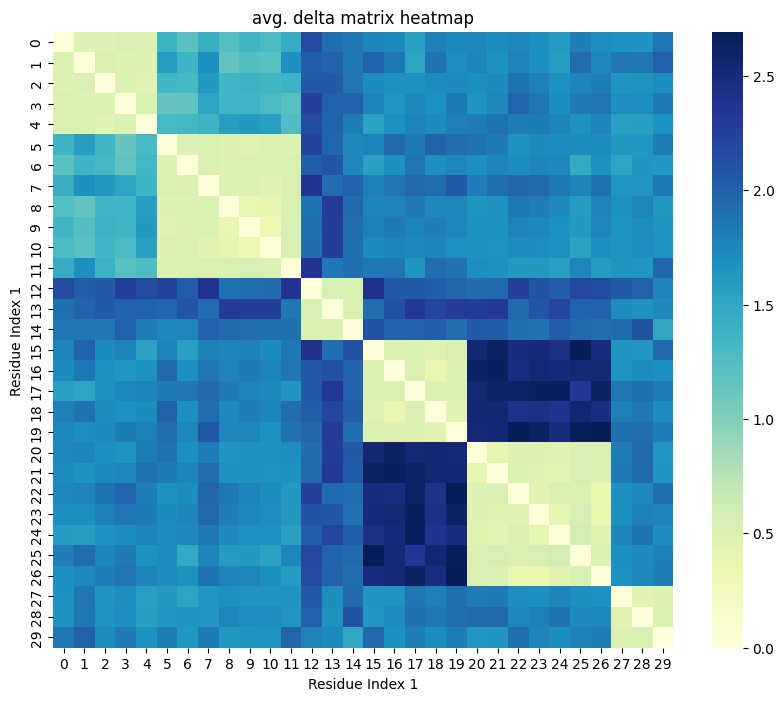

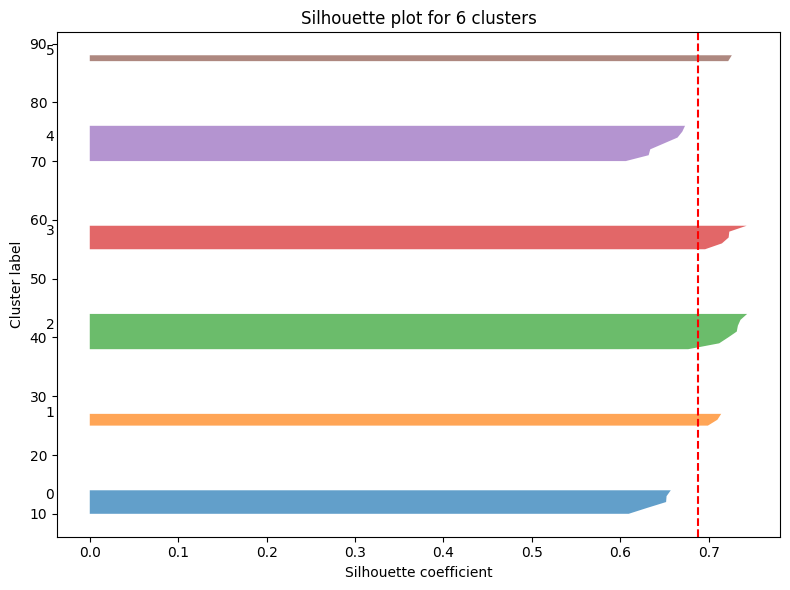

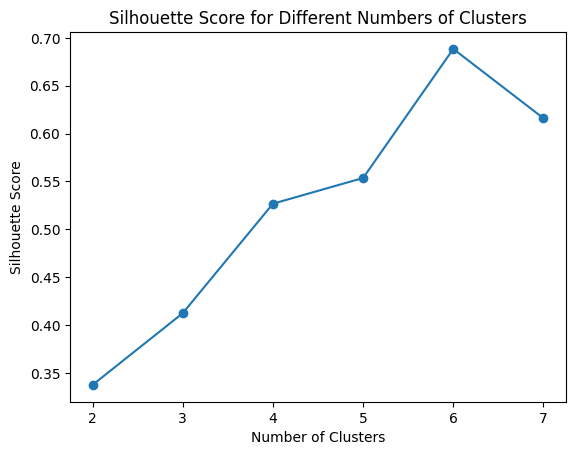

0.8752


In [218]:
spectral_opt_sil_2std = distance_matrix.spectral_clustering_on_deltas(summed_delta_matrix_2std, cluster_count=None, silhouette = True)
spectral_opt_sil_2std = list(spectral_opt_sil_2std)

In [219]:
clustering_names = []
clustering_results = []

clustering_names.append("hdbscan, min_cluster:2, min_samples:1")
clustering_results.append(list(res_hdbscan_2_1[0]))
clustering_names.append("hdbscan, +2std, min_cluster:2, min_samples:1")
clustering_results.append(list(res_hdbscan_2std[0]))

clustering_names.append("hdbscan, min_cluster:2, min_samples:2")
clustering_results.append(list(result_hdbscan_2_2.labels_))
clustering_names.append("hdbscan, +2std, min_cluster:2, min_samples:2")
clustering_results.append(list(result_hdbscan_2_2_2std.labels_))
clustering_names.append("hdbscan, min_cluster:4, min_samples:2")
clustering_results.append(list(result_hdbscan_4_2.labels_))
clustering_names.append("hdbscan, +1std, min_cluster:4, min_samples:2")
clustering_results.append(list(result_hdbscan_4_2_1std.labels_))



clustering_names.append("spectral,  clusters:6")
clustering_results.append(list(result_spectral_6.labels_))
clustering_names.append("spectral,  clusters:3")
clustering_results.append(list(result_spectral_3.labels_))
clustering_names.append("spectral,  clusters:4")
clustering_results.append(list(result_spectral_4.labels_))

clustering_names.append("affinity prop")
clustering_results.append(list(clustering_aff.labels_))
clustering_names.append("affinity prop, +1std")
clustering_results.append(list(clustering_aff_1std.labels_))
clustering_names.append("affinity prop, +2std")
clustering_results.append(list(clustering_aff_2std.labels_))

clustering_names.append("spectra, opt.silh.")
clustering_results.append(list(spectral_opt_sil))
clustering_names.append("spectra, opt.silh., +1std")
clustering_results.append(list(spectral_opt_sil_1std))
clustering_names.append("spectra, opt.silh., +2std")
clustering_results.append(list(spectral_opt_sil_2std))





In [220]:
import numpy as np
from scipy.optimize import linear_sum_assignment
from sklearn.metrics import confusion_matrix

def evaluate_clustering_nr_wrong_elements(true_labels, predicted_labels):

    cm = confusion_matrix(true_labels, predicted_labels)
    
    # Hungarian / Munkres algorithm
    row_ind, col_ind = linear_sum_assignment(-cm)
    
    correctly_clustered = cm[row_ind, col_ind].sum()
    
    total_items = len(true_labels)
    wrongly_clustered = total_items - correctly_clustered
    
    return wrongly_clustered

In [221]:
traj_array = np.array(trajectories)[:,:,:-1]

In [222]:
flattened_array = traj_array.reshape(traj_array.shape[0], -1)

In [223]:
clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2) 


result_hdbscan_2_2_flat = clustering.fit(flattened_array.astype(np.float64))


In [224]:
result_hdbscan_2_2_flat.labels_


array([3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 2, 2, 2, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 2, 2, 2])

In [225]:
clustering = SpectralClustering(n_clusters=3)
result_spectral_3_flat = clustering.fit(flattened_array)

In [226]:
result_spectral_3_flat.labels_

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

In [227]:
#vels_to_cluster = process_data.simulation_to_array_velocities(particles_from_sim)

In [228]:
def compute_velocities(points, delta_t=1):

    velocities = []
    
    for point_series in points:
        point_velocities = []
        for i in range(1, len(point_series)):
            velocity = [(point_series[i][j] - point_series[i-1][j]) / delta_t for j in range(3)]
            point_velocities.append(velocity)
        
        #let's assume starting velocity is 0
        point_velocities.insert(0, [0.0, 0.0, 0.0])
        velocities.append(point_velocities)
    
    return velocities

    
try:
    vels_to_cluster = process_data.simulation_to_array_velocities(particles_from_sim)

except:
    print("no simulation data with velocities")
    traj_array_vel = compute_velocities(traj_array)
    traj_array_vel = np.array(traj_array_vel)
    flattened_array_vel =  traj_array_vel.reshape(traj_array_vel.shape[0], -1)

no simulation data with velocities


In [229]:
traj_array = np.array(trajectories)[:,:,:-1]
flattened_array = traj_array.reshape(traj_array.shape[0], -1)

In [230]:
#traj_array_vel = np.array(vels_to_cluster)[:,:,:-1]
#flattened_array_vel = traj_array_vel.reshape(traj_array_vel.shape[0], -1)

In [231]:
clustering = SpectralClustering(n_clusters=3)
result_spectral_3_flat = clustering.fit(flattened_array)
result_spectral_3_flat.labels_

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

In [232]:
clustering = SpectralClustering(n_clusters=4)
result_spectral_4_flat = clustering.fit(flattened_array)
result_spectral_4_flat.labels_

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2], dtype=int32)

In [233]:
clustering = SpectralClustering(n_clusters=3)
result_spectral_3_flat_vel = clustering.fit(flattened_array_vel)
result_spectral_3_flat_vel.labels_

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 1], dtype=int32)

In [234]:
clustering = SpectralClustering(n_clusters=4)
result_spectral_4_flat_vel = clustering.fit(flattened_array_vel)
result_spectral_4_flat_vel.labels_

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 2, 2, 2, 2, 2, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 1], dtype=int32)

In [235]:
clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2) 


result_hdbscan_2_2_flat = clustering.fit(flattened_array.astype(np.float64))
result_hdbscan_2_2_flat.labels_

array([3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 2, 2, 2, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 2, 2, 2])

In [236]:
clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=1) 


result_hdbscan_2_1_flat_vel = clustering.fit(flattened_array_vel.astype(np.float64))
result_hdbscan_2_1_flat_vel.labels_

array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 4, 4, 4, 4, 4, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 1])

In [237]:
clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2) 


result_hdbscan_2_2_flat_vel = clustering.fit(flattened_array_vel.astype(np.float64))
result_hdbscan_2_2_flat_vel.labels_

array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 4, 4, 4, 4, 4, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 1])

In [238]:
clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2) 


result_hdbscan_2_2_flat = clustering.fit(flattened_array.astype(np.float64))
result_hdbscan_2_2_flat.labels_

clustering_names.append("hdbscan, flattened positions, 2, 2")
clustering_results.append(list(result_hdbscan_2_2_flat.labels_))

In [239]:
clustering = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=2) 


result_hdbscan_2_2_flat_vel = clustering.fit(flattened_array_vel.astype(np.float64))
result_hdbscan_2_2_flat_vel.labels_

clustering_names.append("hdbscan, flattened velocities, 2, 2")
clustering_results.append(list(result_hdbscan_2_2_flat_vel.labels_))

In [240]:

clustering_names.append("ground truth")
clustering_results.append(list(true_labels))

In [241]:
result_hdbscan_2_2.labels_

array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 0, 0, 0, 4, 4, 4, 4, 4, 2, 2,
       2, 2, 2, 2, 2, 1, 1, 1])

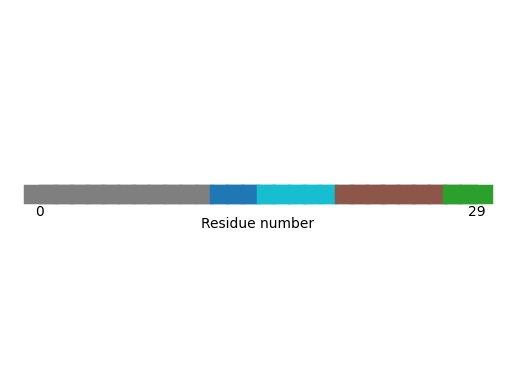

In [242]:
visualizations.plot_residue_line_plus_noise(residue_items, result_hdbscan_2_2.labels_)

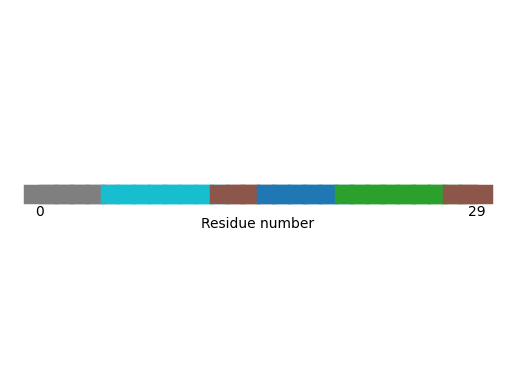

In [243]:
visualizations.plot_residue_line_plus_noise(residue_items, result_hdbscan_2_2_flat.labels_)

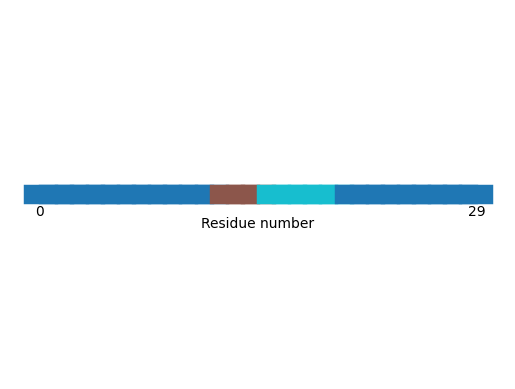

In [244]:
visualizations.plot_residue_line_plus_noise(residue_items, result_spectral_3.labels_)

In [245]:
import sklearn 
def get_clustering_similarity_true(true_clustering, clusterings, sim_function = sklearn.metrics.adjusted_rand_score):
    sim_results = []
    for i in range(len(clusterings)):
        sim_result = sim_function(true_clustering, clusterings[i])
        sim_results.append(sim_result)
    return sim_results

def get_clustering_similarity_true_trajectories(true_clusterings, clusterings, sim_function = sklearn.metrics.adjusted_rand_score):
    sim_results = []
    for i in range(len(clusterings)):
        sim_result = sim_function(true_clusterings[i], clusterings[i])
        sim_results.append(sim_result)
    return sim_result



Text(0.5, 1.0, 'adjusted rand score')

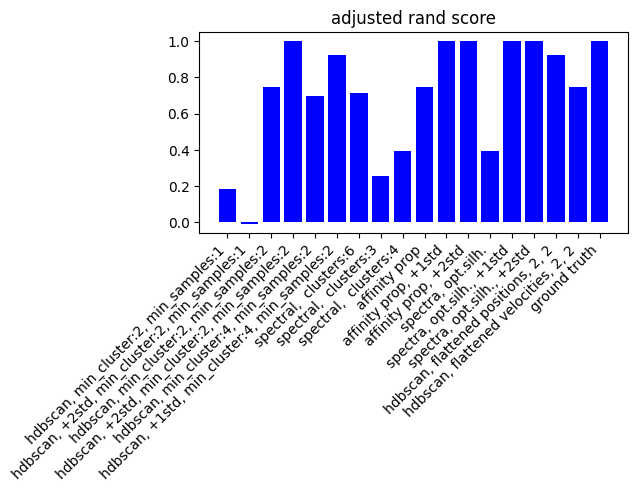

In [246]:
sim_scores = get_clustering_similarity_true(true_labels, clustering_results)
plt.bar(clustering_names, sim_scores, color='blue')
plt.xticks(rotation=45, ha='right')  

plt.tight_layout()

plt.title("adjusted rand score")

Text(0.5, 1.0, 'nr. of wrong elements')

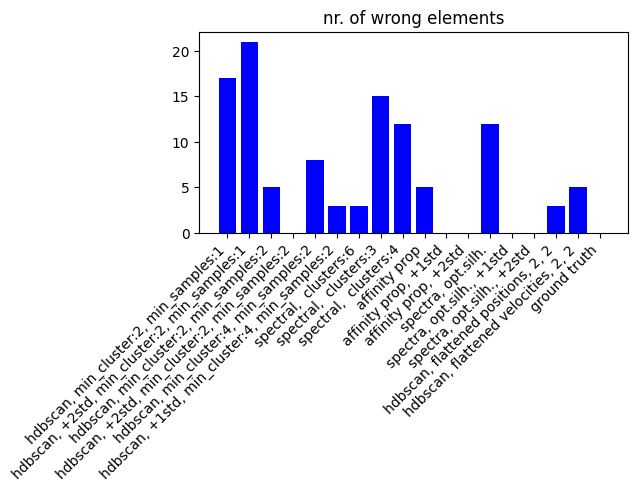

In [247]:
sim_scores = get_clustering_similarity_true(true_labels, clustering_results, evaluate_clustering_nr_wrong_elements)
plt.bar(clustering_names, sim_scores, color='blue')
plt.xticks(rotation=45, ha='right')  

plt.tight_layout()

plt.title("nr. of wrong elements")

Text(0.5, 1.0, 'NMI')

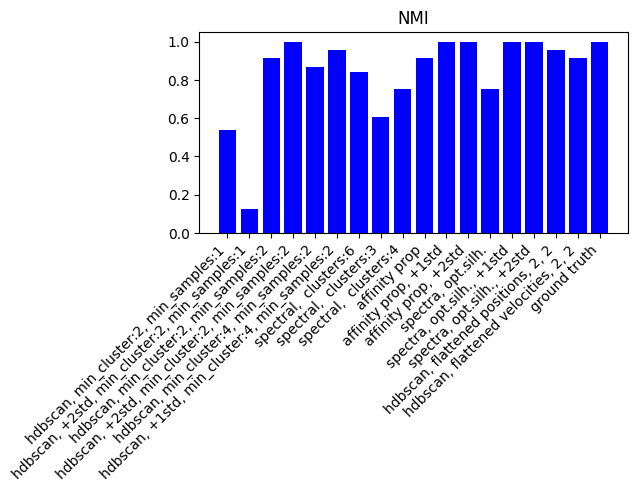

In [248]:
sim_scores = get_clustering_similarity_true(true_labels, clustering_results, sklearn.metrics.normalized_mutual_info_score)
plt.bar(clustering_names, sim_scores, color='blue')
plt.xticks(rotation=45, ha='right') 

plt.tight_layout()

plt.title("NMI")

Text(0.5, 1.0, 'number of points class. as noise')

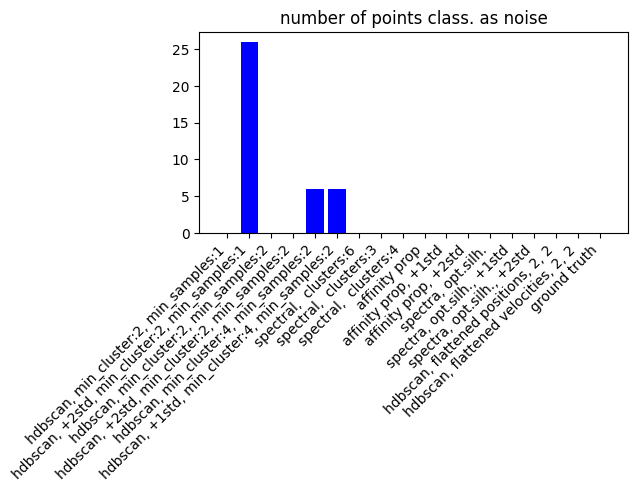

In [249]:
noise_elements = []
noise_int = -1
for res in clustering_results:
    noise_el = len(np.where(np.array(res)==noise_int)[0])
    noise_elements.append(noise_el)

plt.bar(clustering_names, noise_elements, color='blue')
plt.xticks(rotation=45, ha='right') 

plt.tight_layout()

plt.title("number of points class. as noise")

Text(0.5, 1.0, 'number of clusters')

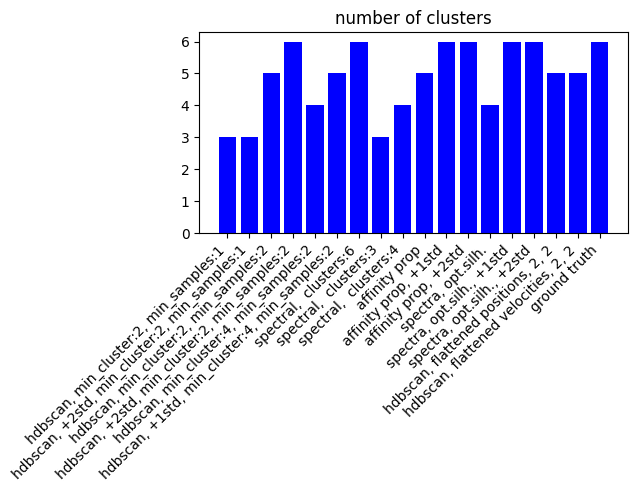

In [250]:

plt.bar(clustering_names, [len(np.unique(x)) for x in clustering_results], color='blue')
plt.xticks(rotation=45, ha='right') 

plt.tight_layout()

plt.title("number of clusters")

In [251]:
#Q calculations

clustering contains noise
clustering contains noise
clustering contains noise


Text(0.5, 1.0, 'Q_max from distance matrices, full, thinning=500')

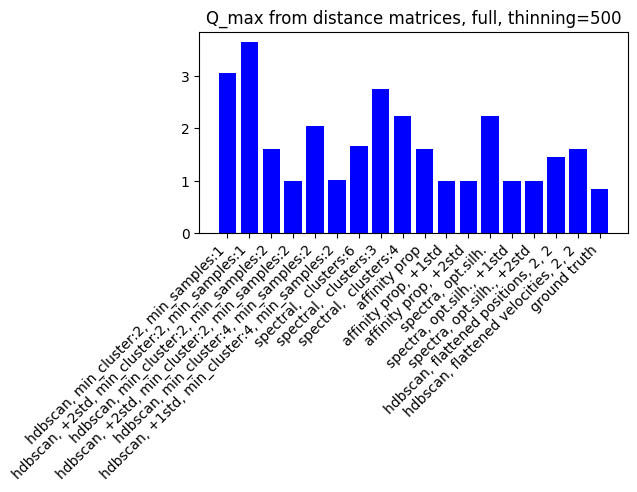

In [252]:
Qs = []
for res in clustering_results:

    new_dist_Q_max_value, _ = get_Q_for_clustering_extended(dist_matrices, np.array(res), None, use_max=True, thinning_factor=500, only_adjacent=False, reference_frame=None, return_raw=False)
    Qs.append(new_dist_Q_max_value)

plt.bar(clustering_names, Qs, color='blue')
plt.xticks(rotation=45, ha='right') 

plt.tight_layout()

plt.title("Q_max from distance matrices, full, thinning=500")

In [288]:
Qs = []
for res in clustering_results:

    new_dist_Q_max_value, _ = get_Q_for_clustering_extended(dist_matrices, np.array(res), None, use_max=True, thinning_factor=500, only_adjacent=False, reference_frame=None, return_raw=False)
    Qs.append(new_dist_Q_max_value)

plt.bar(clustering_names, Qs, color='blue')
plt.xticks(rotation=45, ha='right') 

plt.tight_layout()

plt.title("Q_max from distance matrices, full, thinning=500")

clustering contains noise
clustering contains noise
clustering contains noise


<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Q_max from distance matrices, full, thinning=500')

clustering contains noise
clustering contains noise
clustering contains noise


Text(0.5, 1.0, 'Q_max from distance matrices, full')

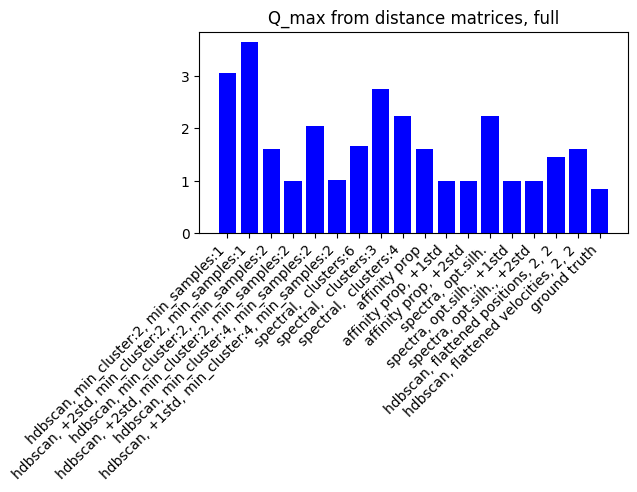

In [257]:
Qs = []
for res in clustering_results:

    new_dist_Q_max_value, _ = get_Q_for_clustering_extended(dist_matrices, np.array(res), None, use_max=True, thinning_factor=None, only_adjacent=False, reference_frame=None, return_raw=False)
    Qs.append(new_dist_Q_max_value)

plt.bar(clustering_names, Qs, color='blue')
plt.xticks(rotation=45, ha='right') 

plt.tight_layout()

plt.title("Q_max from distance matrices, full")

clustering contains noise
clustering contains noise
clustering contains noise


Text(0.5, 1.0, 'Q_mean from distance matrices, full')

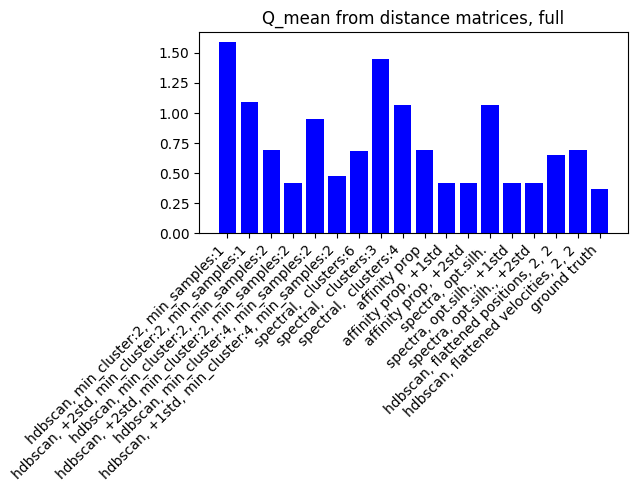

In [258]:
Qsf3= []
for res in clustering_results:

    new_dist_Q_max_value, _ = get_Q_for_clustering_extended(dist_matrices, np.array(res), None, use_max=False, thinning_factor=None, only_adjacent=False, reference_frame=None, return_raw=False)
    Qsf3.append(new_dist_Q_max_value)

plt.bar(clustering_names, Qsf3, color='blue')
plt.xticks(rotation=45, ha='right') 

plt.tight_layout()

plt.title("Q_mean from distance matrices, full")

clustering contains noise
clustering contains noise
clustering contains noise


Text(0.5, 1.0, 'Q_max from positions, Kabsch superimposition, full, thinning=100')

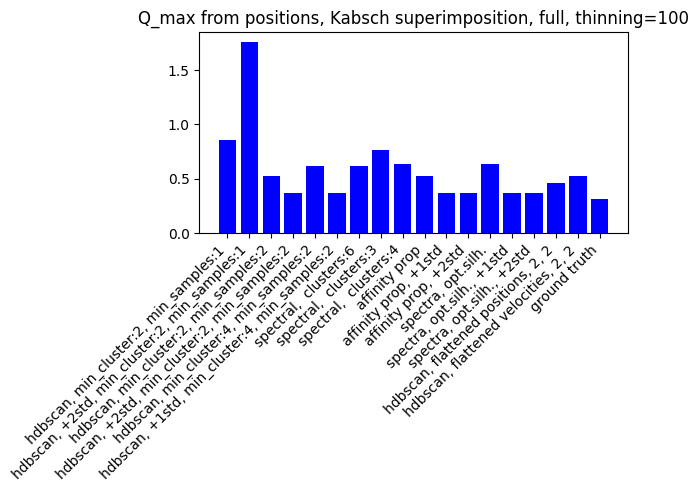

In [259]:

Qs = []

for res in clustering_results:


    new_dist_Q_max_value, _ = get_Q_for_clustering_positions(traj_array, np.array(res), None, use_max=True, apply_superimposition = "kabsch", thinning_factor=100, only_adjacent=False, reference_frame=None, return_raw=False)
    Qs.append(new_dist_Q_max_value)

plt.bar(clustering_names, Qs, color='blue')
plt.xticks(rotation=45, ha='right') 

plt.tight_layout()

plt.title("Q_max from positions, Kabsch superimposition, full, thinning=100")

clustering contains noise
clustering contains noise
clustering contains noise


Text(0.5, 1.0, 'Q_mean from positions, Kabsch superimposition, full')

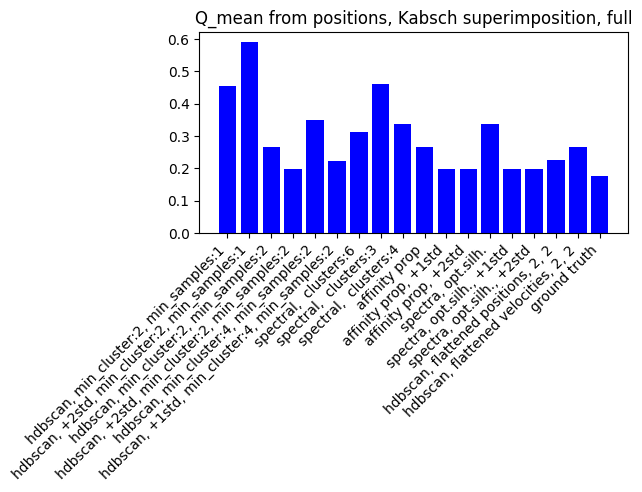

In [260]:
Qs = []

for res in clustering_results:


    new_dist_Q_max_value, _ = get_Q_for_clustering_positions(traj_array, np.array(res), None, use_max=False, apply_superimposition = "kabsch", thinning_factor=50, only_adjacent=False, reference_frame=None, return_raw=False)
    Qs.append(new_dist_Q_max_value)

plt.bar(clustering_names, Qs, color='blue')
plt.xticks(rotation=45, ha='right') 

plt.tight_layout()

plt.title("Q_mean from positions, Kabsch superimposition, full")

In [261]:
#q computation fuer verschiedene cluster

In [262]:
import compare_clusterings
import numpy as np
from itertools import combinations

In [263]:
from compare_clusterings import *
from manipulate_trajectory import thin_trajectory

In [265]:
clustering_results

[[1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  0,
  0,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  2,
  2,
  2],
 [-1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  0,
  -1,
  -1,
  -1,
  1,
  -1,
  0,
  -1,
  -1,
  -1,
  1,
  -1,
  -1,
  -1,
  -1],
 [3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  0,
  0,
  0,
  4,
  4,
  4,
  4,
  4,
  2,
  2,
  2,
  2,
  2,
  2,
  2,
  1,
  1,
  1],
 [4,
  4,
  4,
  4,
  4,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  2,
  2,
  2,
  0,
  0,
  0,
  0,
  0,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  1,
  1,
  1],
 [1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  -1,
  -1,
  -1,
  2,
  2,
  2,
  2,
  2,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  -1,
  -1,
  -1],
 [2,
  2,
  2,
  2,
  2,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  -1,
  -1,
  -1,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  -1,
  -1,
  -1],
 [0,
  0,
  0,
  0,
  4,
  4,
  4,
  4,
  4,
  4,
  4,
 

In [266]:
clustering_names

['hdbscan, min_cluster:2, min_samples:1',
 'hdbscan, +2std, min_cluster:2, min_samples:1',
 'hdbscan, min_cluster:2, min_samples:2',
 'hdbscan, +2std, min_cluster:2, min_samples:2',
 'hdbscan, min_cluster:4, min_samples:2',
 'hdbscan, +1std, min_cluster:4, min_samples:2',
 'spectral,  clusters:6',
 'spectral,  clusters:3',
 'spectral,  clusters:4',
 'affinity prop',
 'affinity prop, +1std',
 'affinity prop, +2std',
 'spectra, opt.silh.',
 'spectra, opt.silh., +1std',
 'spectra, opt.silh., +2std',
 'hdbscan, flattened positions, 2, 2',
 'hdbscan, flattened velocities, 2, 2',
 'ground truth']

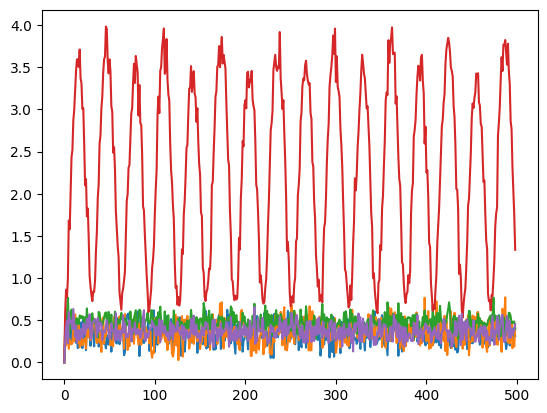

In [267]:
current_clustering = np.array(clustering_results[clustering_names.index('hdbscan, min_cluster:2, min_samples:2')])
qtraj_nosup = get_Q_for_clustering_positions(traj_array, current_clustering, None, use_max=True, center_positions=False, apply_superimposition = None, thinning_factor=None, only_adjacent=False, reference_frame=0, return_raw=True)
qtraj_center = get_Q_for_clustering_positions(traj_array, current_clustering, None, use_max=True, center_positions=True, apply_superimposition = None, thinning_factor=None, only_adjacent=False, reference_frame=0, return_raw=True)
qtraj_kabsch = get_Q_for_clustering_positions(traj_array, current_clustering, None, use_max=True, center_positions=True, apply_superimposition = "kabsch", thinning_factor=None, only_adjacent=False, reference_frame=0, return_raw=True)
qtraj_procrustes = get_Q_for_clustering_positions(traj_array, current_clustering, None, use_max=True, center_positions=True, apply_superimposition = "procrustes", thinning_factor=None, only_adjacent=False, reference_frame=0, return_raw=True)
qtraj_dist = get_Q_for_clustering_extended(dist_matrices, current_clustering, None, use_max=True, thinning_factor=None, only_adjacent=False, reference_frame=0, return_raw=True)
qtraj_dist_adj = get_Q_for_clustering_extended(dist_matrices, current_clustering, None, use_max=True, thinning_factor=None, only_adjacent=True,  return_raw=True)

for qt in qtraj_dist:
    plt.plot(qt)

In [268]:
current_clustering = np.array(clustering_results[clustering_names.index('ground truth')])

In [269]:
qtraj_nosup = get_Q_for_clustering_positions(traj_array, current_clustering, None, use_max=True, center_positions=False, apply_superimposition = None, thinning_factor=None, only_adjacent=False, reference_frame=0, return_raw=True)
qtraj_center = get_Q_for_clustering_positions(traj_array, current_clustering, None, use_max=True, center_positions=True, apply_superimposition = None, thinning_factor=None, only_adjacent=False, reference_frame=0, return_raw=True)
qtraj_kabsch = get_Q_for_clustering_positions(traj_array, current_clustering, None, use_max=True, center_positions=True, apply_superimposition = "kabsch", thinning_factor=None, only_adjacent=False, reference_frame=0, return_raw=True)
qtraj_procrustes = get_Q_for_clustering_positions(traj_array, current_clustering, None, use_max=True, center_positions=True, apply_superimposition = "procrustes", thinning_factor=None, only_adjacent=False, reference_frame=0, return_raw=True)
qtraj_dist = get_Q_for_clustering_extended(dist_matrices, current_clustering, None, use_max=True, thinning_factor=None, only_adjacent=False, reference_frame=0, return_raw=True)
qtraj_dist_adj = get_Q_for_clustering_extended(dist_matrices, current_clustering, None, use_max=True, thinning_factor=None, only_adjacent=True,  return_raw=True)



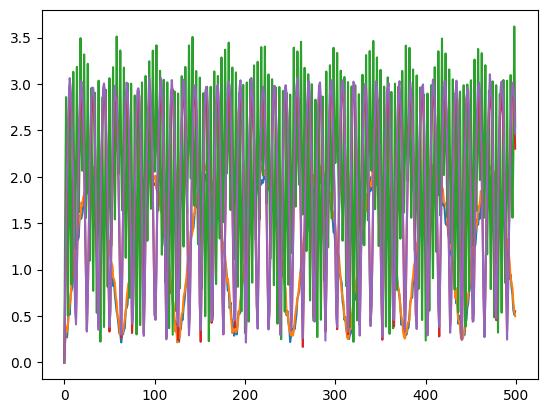

In [270]:
for qt in qtraj_nosup:
    plt.plot(qt)

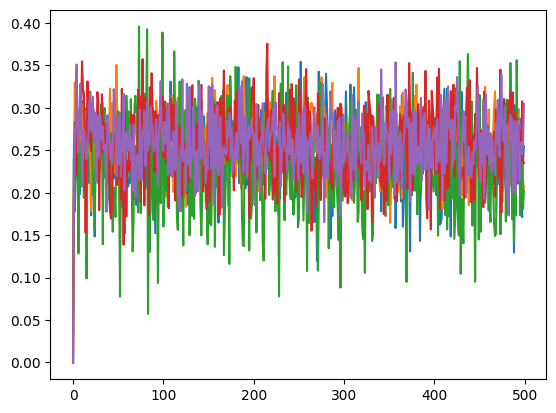

In [271]:
for qt in qtraj_center:
    plt.plot(qt)

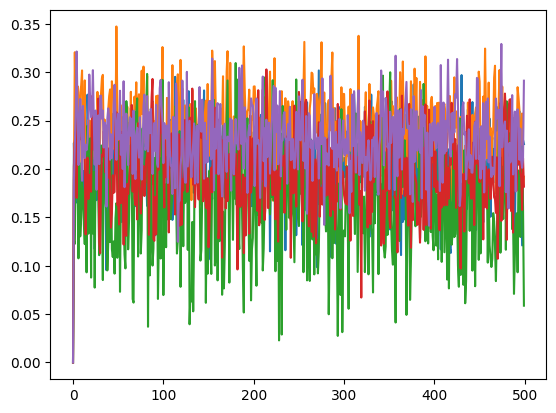

In [272]:
for qt in qtraj_kabsch:
    plt.plot(qt)

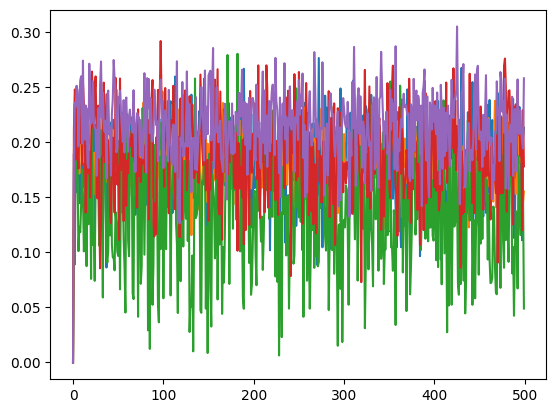

In [273]:
for qt in qtraj_procrustes:
    plt.plot(qt)

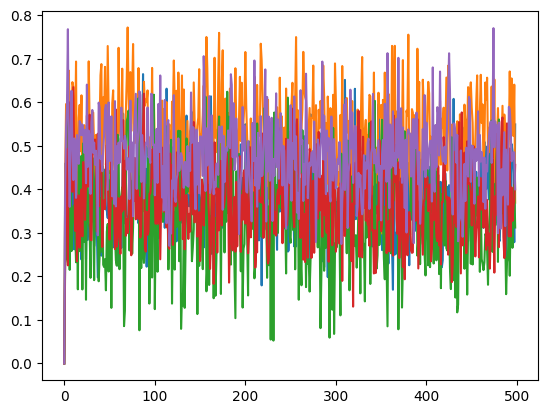

In [274]:
for qt in qtraj_dist:
    plt.plot(qt)

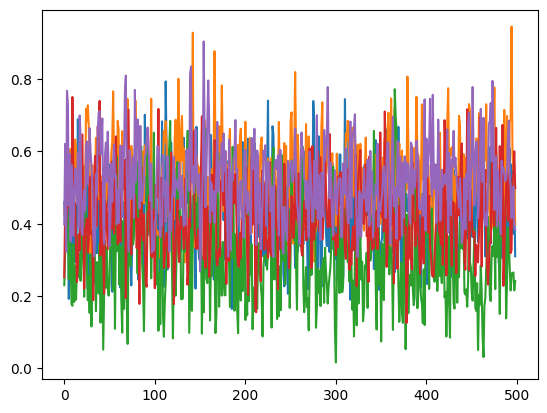

In [275]:
for qt in qtraj_dist_adj:
    plt.plot(qt)

In [276]:
clustering_results

[[1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  0,
  0,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  2,
  2,
  2],
 [-1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  0,
  -1,
  -1,
  -1,
  1,
  -1,
  0,
  -1,
  -1,
  -1,
  1,
  -1,
  -1,
  -1,
  -1],
 [3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  0,
  0,
  0,
  4,
  4,
  4,
  4,
  4,
  2,
  2,
  2,
  2,
  2,
  2,
  2,
  1,
  1,
  1],
 [4,
  4,
  4,
  4,
  4,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  2,
  2,
  2,
  0,
  0,
  0,
  0,
  0,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  1,
  1,
  1],
 [1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  -1,
  -1,
  -1,
  2,
  2,
  2,
  2,
  2,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  -1,
  -1,
  -1],
 [2,
  2,
  2,
  2,
  2,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  -1,
  -1,
  -1,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  -1,
  -1,
  -1],
 [0,
  0,
  0,
  0,
  4,
  4,
  4,
  4,
  4,
  4,
  4,
 

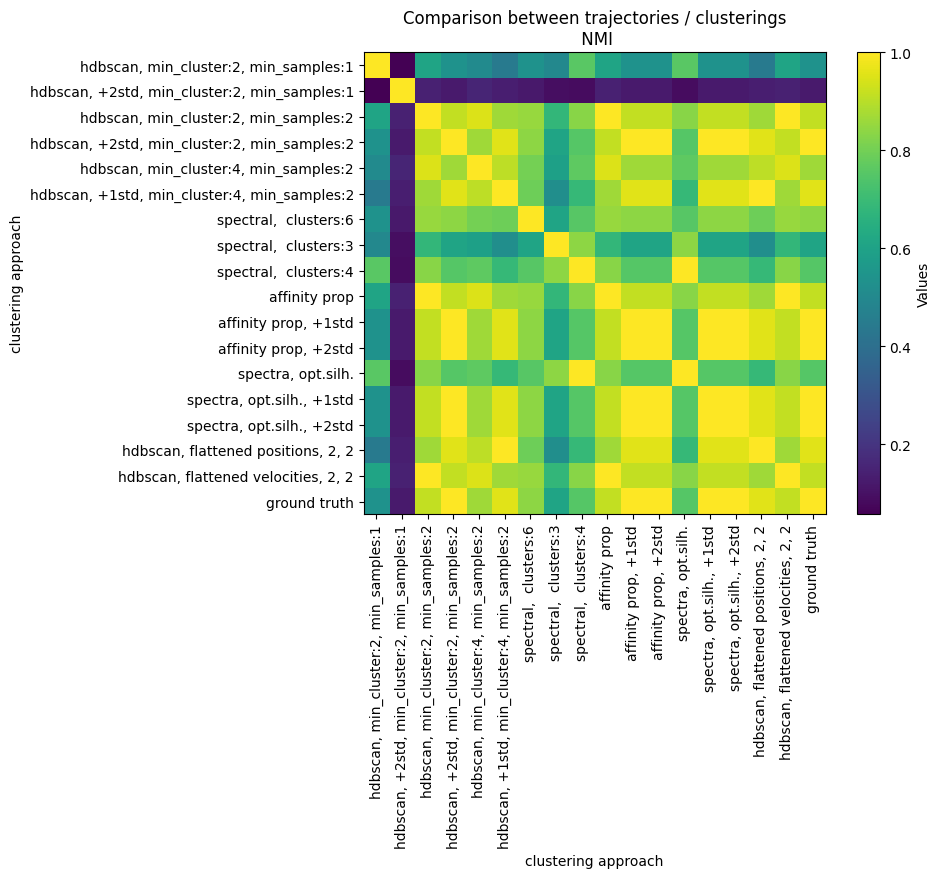

[[0, 0, 1.0],
 [0, 1, 0.05733432291498293],
 [0, 2, 0.6073700333026691],
 [0, 3, 0.5379200778670502],
 [0, 4, 0.5091523766706305],
 [0, 5, 0.44732573934712444],
 [0, 6, 0.5390040667582258],
 [0, 7, 0.49727526638938035],
 [0, 8, 0.7573909408098213],
 [0, 9, 0.6073700333026691],
 [0, 10, 0.5379200778670503],
 [0, 11, 0.5379200778670503],
 [0, 12, 0.7573909408098213],
 [0, 13, 0.5379200778670503],
 [0, 14, 0.5379200778670503],
 [0, 15, 0.44732573934712444],
 [0, 16, 0.6073700333026691],
 [0, 17, 0.5379200778670503],
 [1, 0, 0.05733432291498293],
 [1, 1, 1.0000000000000002],
 [1, 2, 0.14449889899452845],
 [1, 3, 0.12683143655256812],
 [1, 4, 0.15555585883572587],
 [1, 5, 0.13527092644135996],
 [1, 6, 0.1227946517282287],
 [1, 7, 0.09200072421551281],
 [1, 8, 0.08789186149856087],
 [1, 9, 0.14449889899452845],
 [1, 10, 0.12683143655256815],
 [1, 11, 0.12683143655256815],
 [1, 12, 0.08789186149856087],
 [1, 13, 0.12683143655256815],
 [1, 14, 0.12683143655256815],
 [1, 15, 0.13527092644135996

In [279]:
%matplotlib inline
get_trajectory_heatmap(np.array(clustering_results), np.array(clustering_results), nmi = True, create_heatmap = True, title = "Comparison between trajectories / clusterings", names=clustering_names, heatmap_label="clustering approach")

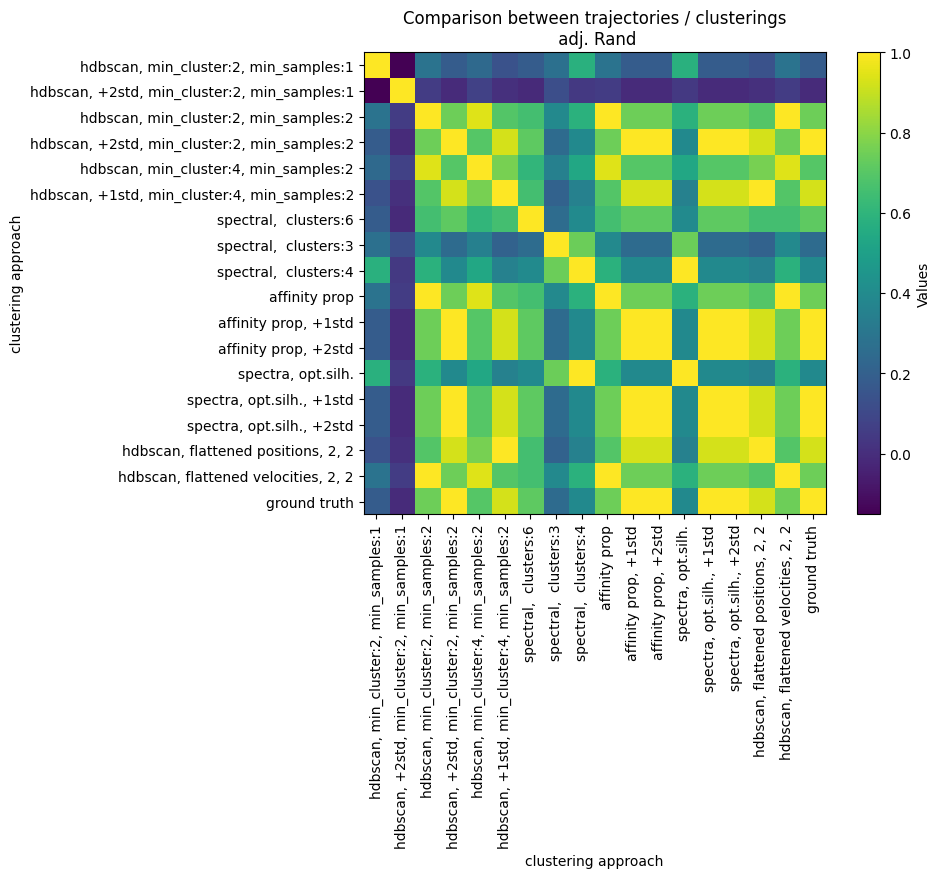

[[0, 0, 1.0],
 [0, 1, -0.15117969361511796],
 [0, 2, 0.28814349579002224],
 [0, 3, 0.18268977506189749],
 [0, 4, 0.24433109718911128],
 [0, 5, 0.13954602304478564],
 [0, 6, 0.18558658333992564],
 [0, 7, 0.27495229949338773],
 [0, 8, 0.5806569454169077],
 [0, 9, 0.28814349579002224],
 [0, 10, 0.18268977506189749],
 [0, 11, 0.18268977506189749],
 [0, 12, 0.5806569454169077],
 [0, 13, 0.18268977506189749],
 [0, 14, 0.18268977506189749],
 [0, 15, 0.13954602304478564],
 [0, 16, 0.28814349579002224],
 [0, 17, 0.18268977506189749],
 [1, 0, -0.15117969361511796],
 [1, 1, 1.0],
 [1, 2, 0.05504311209143774],
 [1, 3, -0.007632329038185202],
 [1, 4, 0.07247891128723974],
 [1, 5, 0.007752308943867541],
 [1, 6, -0.01278965500967483],
 [1, 7, 0.1232307536398338],
 [1, 8, 0.03802866958891127],
 [1, 9, 0.05504311209143774],
 [1, 10, -0.007632329038185202],
 [1, 11, -0.007632329038185202],
 [1, 12, 0.03802866958891127],
 [1, 13, -0.007632329038185202],
 [1, 14, -0.007632329038185202],
 [1, 15, 0.0077523

In [280]:
get_trajectory_heatmap(np.array(clustering_results), np.array(clustering_results), nmi = False, create_heatmap = True, title = "Comparison between trajectories / clusterings", names=clustering_names, heatmap_label="clustering approach")

In [281]:
clustering_results

[[1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  0,
  0,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  2,
  2,
  2],
 [-1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  -1,
  0,
  -1,
  -1,
  -1,
  1,
  -1,
  0,
  -1,
  -1,
  -1,
  1,
  -1,
  -1,
  -1,
  -1],
 [3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  0,
  0,
  0,
  4,
  4,
  4,
  4,
  4,
  2,
  2,
  2,
  2,
  2,
  2,
  2,
  1,
  1,
  1],
 [4,
  4,
  4,
  4,
  4,
  5,
  5,
  5,
  5,
  5,
  5,
  5,
  2,
  2,
  2,
  0,
  0,
  0,
  0,
  0,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  1,
  1,
  1],
 [1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  -1,
  -1,
  -1,
  2,
  2,
  2,
  2,
  2,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  -1,
  -1,
  -1],
 [2,
  2,
  2,
  2,
  2,
  3,
  3,
  3,
  3,
  3,
  3,
  3,
  -1,
  -1,
  -1,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  -1,
  -1,
  -1],
 [0,
  0,
  0,
  0,
  4,
  4,
  4,
  4,
  4,
  4,
  4,
 

In [282]:
clustering_names

['hdbscan, min_cluster:2, min_samples:1',
 'hdbscan, +2std, min_cluster:2, min_samples:1',
 'hdbscan, min_cluster:2, min_samples:2',
 'hdbscan, +2std, min_cluster:2, min_samples:2',
 'hdbscan, min_cluster:4, min_samples:2',
 'hdbscan, +1std, min_cluster:4, min_samples:2',
 'spectral,  clusters:6',
 'spectral,  clusters:3',
 'spectral,  clusters:4',
 'affinity prop',
 'affinity prop, +1std',
 'affinity prop, +2std',
 'spectra, opt.silh.',
 'spectra, opt.silh., +1std',
 'spectra, opt.silh., +2std',
 'hdbscan, flattened positions, 2, 2',
 'hdbscan, flattened velocities, 2, 2',
 'ground truth']

In [283]:

new_plot_data = process_data.prepare_clustered_results_for_plotly(trajectories, np.array(clustering_results[clustering_names.index('spectral,  clusters:6')]))

In [286]:
%matplotlib notebook

ab_hsv = plot_functions.plot_traj_labels_plt(new_plot_data, save_video=False, interval = 200, color_map='Spectral', noise_label = -1, title = "\n spectral,  clusters:6")

<IPython.core.display.Javascript object>

In [287]:
from IPython.display import HTML
HTML(ab_hsv.to_html5_video())